# Project Name: Recognize genre of a song

In [85]:
# Contributor: Rubaiya Kabir Pranti
# Contributor: Roman Schumichin
# Contributor: Vijaya Madasu

### Importing Libraries

In [86]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline

### Loading Dataset

In [87]:
df = pd.read_csv('extracted_audio_dataset.csv',index_col=0)

In [88]:
df

,track_name,artist_name,album_name,genre,duration_ms_x,popularity,explicit,track_id,artist_id,danceability,...,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms_y,time_signature
0,Balanço Zona Sul,Wilson Simonal,"Tem ""Algo Mais""",pagode,152960,38,False,73P2hHCGMDlET853vUOq08,6DqFCzjARUV3xH9meu3Bya,0.511,...,0.000000,0.1410,0.705,139.489,audio_features,spotify:track:73P2hHCGMDlET853vUOq08,https://api.spotify.com/v1/tracks/73P2hHCGMDlE...,https://api.spotify.com/v1/audio-analysis/73P2...,152960,4
1,If You Could Read My Mind,Gordon Lightfoot,If You Could Read My Mind,folk,228840,64,False,57ct8jKi6trntXiRV0NnXi,23rleGXVOVVgTk3xgtmfE4,0.612,...,0.000079,0.1150,0.223,122.565,audio_features,spotify:track:57ct8jKi6trntXiRV0NnXi,https://api.spotify.com/v1/tracks/57ct8jKi6trn...,https://api.spotify.com/v1/audio-analysis/57ct...,228840,4
2,If You Could Read My Mind,Gordon Lightfoot,If You Could Read My Mind,folk,228840,64,False,57ct8jKi6trntXiRV0NnXi,23rleGXVOVVgTk3xgtmfE4,0.612,...,0.000079,0.1150,0.223,122.565,audio_features,spotify:track:57ct8jKi6trntXiRV0NnXi,https://api.spotify.com/v1/tracks/57ct8jKi6trn...,https://api.spotify.com/v1/audio-analysis/57ct...,228840,4
3,If You Could Read My Mind,Gordon Lightfoot,If You Could Read My Mind,folk,228840,64,False,57ct8jKi6trntXiRV0NnXi,23rleGXVOVVgTk3xgtmfE4,0.612,...,0.000079,0.1150,0.223,122.565,audio_features,spotify:track:57ct8jKi6trntXiRV0NnXi,https://api.spotify.com/v1/tracks/57ct8jKi6trn...,https://api.spotify.com/v1/audio-analysis/57ct...,228840,4
4,If You Could Read My Mind,Gordon Lightfoot,If You Could Read My Mind,folk,228840,64,False,57ct8jKi6trntXiRV0NnXi,23rleGXVOVVgTk3xgtmfE4,0.612,...,0.000079,0.1150,0.223,122.565,audio_features,spotify:track:57ct8jKi6trntXiRV0NnXi,https://api.spotify.com/v1/tracks/57ct8jKi6trn...,https://api.spotify.com/v1/audio-analysis/57ct...,228840,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366679,The Flame - Single Version,Cheap Trick,"The Epic Archive, Vol. 3 (1984-1992)",power-pop,281693,48,False,1pKubpcbRCOLY4wbvSDqzt,1LB8qB5BPb3MHQrfkvifXU,0.631,...,0.000006,0.1100,0.300,96.820,audio_features,spotify:track:1pKubpcbRCOLY4wbvSDqzt,https://api.spotify.com/v1/tracks/1pKubpcbRCOL...,https://api.spotify.com/v1/audio-analysis/1pKu...,281693,4
366680,Heart Of Glass - Single Version / Remastered,Blondie,Heart Of Glass,power-pop,252893,41,False,5lQOzJmQladWC4kLQClssB,4tpUmLEVLCGFr93o8hFFIB,0.728,...,0.059900,0.0725,0.441,114.686,audio_features,spotify:track:5lQOzJmQladWC4kLQClssB,https://api.spotify.com/v1/tracks/5lQOzJmQladW...,https://api.spotify.com/v1/audio-analysis/5lQO...,252893,4
366681,Everyday - Original Mix,Mahmut Orhan,Everyday,turkish,423529,39,False,47AiGjtI7cOLyPwPSCqTuO,3t8WiyalpvnB9AObcMufiE,0.804,...,0.316000,0.5850,0.572,119.001,audio_features,spotify:track:47AiGjtI7cOLyPwPSCqTuO,https://api.spotify.com/v1/tracks/47AiGjtI7cOL...,https://api.spotify.com/v1/audio-analysis/47Ai...,423529,4
366682,All Along the Watchtower,Jimi Hendrix,Fourth of July,psych-rock,238626,0,False,6LhYshEM4feJKQTr7riTBB,776Uo845nYHJpNaStv1Ds4,0.429,...,0.000025,0.0883,0.615,113.283,audio_features,spotify:track:6LhYshEM4feJKQTr7riTBB,https://api.spotify.com/v1/tracks/6LhYshEM4feJ...,https://api.spotify.com/v1/audio-analysis/6LhY...,238627,4


In [89]:
#total rows and columns of dataset
df.shape

(366684, 26)

Total datapoints are 366684 songs with 26 features/columns.

In [90]:
df.tail()

,track_name,artist_name,album_name,genre,duration_ms_x,popularity,explicit,track_id,artist_id,danceability,...,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms_y,time_signature
366679,The Flame - Single Version,Cheap Trick,"The Epic Archive, Vol. 3 (1984-1992)",power-pop,281693,48,False,1pKubpcbRCOLY4wbvSDqzt,1LB8qB5BPb3MHQrfkvifXU,0.631,...,0.000006,0.1100,0.300,96.820,audio_features,spotify:track:1pKubpcbRCOLY4wbvSDqzt,https://api.spotify.com/v1/tracks/1pKubpcbRCOL...,https://api.spotify.com/v1/audio-analysis/1pKu...,281693,4
366680,Heart Of Glass - Single Version / Remastered,Blondie,Heart Of Glass,power-pop,252893,41,False,5lQOzJmQladWC4kLQClssB,4tpUmLEVLCGFr93o8hFFIB,0.728,...,0.059900,0.0725,0.441,114.686,audio_features,spotify:track:5lQOzJmQladWC4kLQClssB,https://api.spotify.com/v1/tracks/5lQOzJmQladW...,https://api.spotify.com/v1/audio-analysis/5lQO...,252893,4
366681,Everyday - Original Mix,Mahmut Orhan,Everyday,turkish,423529,39,False,47AiGjtI7cOLyPwPSCqTuO,3t8WiyalpvnB9AObcMufiE,0.804,...,0.316000,0.5850,0.572,119.001,audio_features,spotify:track:47AiGjtI7cOLyPwPSCqTuO,https://api.spotify.com/v1/tracks/47AiGjtI7cOL...,https://api.spotify.com/v1/audio-analysis/47Ai...,423529,4
366682,All Along the Watchtower,Jimi Hendrix,Fourth of July,psych-rock,238626,0,False,6LhYshEM4feJKQTr7riTBB,776Uo845nYHJpNaStv1Ds4,0.429,...,0.000025,0.0883,0.615,113.283,audio_features,spotify:track:6LhYshEM4feJKQTr7riTBB,https://api.spotify.com/v1/tracks/6LhYshEM4feJ...,https://api.spotify.com/v1/audio-analysis/6LhY...,238627,4
366683,"Sie werden euch in den Bann tun, BWV 44: VI. A...",Johann Sebastian Bach,"J.S. Bach: Sie werden euch in den Bann tun, BW...",german,312933,17,False,5wN3m1cgWLuaNqlL1NZxyZ,5aIqB5nVVvmFsvSdExz408,0.366,...,0.522000,0.2750,0.443,136.202,audio_features,spotify:track:5wN3m1cgWLuaNqlL1NZxyZ,https://api.spotify.com/v1/tracks/5wN3m1cgWLua...,https://api.spotify.com/v1/audio-analysis/5wN3...,312933,4


# Data Pre-processing

# Data Cleaning

1. Deleting rows with missing values
2. Deleting rows that contain Duplicate Data
3. Replacing Booleans with numericals
4. Taking desired genres

## 1. Deleting rows with missing values

In [91]:
#checking for missing values for each column
df.isnull().sum()

track_name          0
artist_name         0
album_name          0
genre               0
duration_ms_x       0
popularity          0
explicit            0
track_id            0
artist_id           0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
type                0
uri                 0
track_href          0
analysis_url        0
duration_ms_y       0
time_signature      0
dtype: int64

 It is visible that we have no missing values. So we don't need to use dropna() function

## 2. Deleting rows that contain 'Duplicate songs'

In [92]:
#removing duplicate songs/tracks
df.drop_duplicates(subset=['track_name','artist_name'],inplace=True, ignore_index=True)

In [93]:
df

,track_name,artist_name,album_name,genre,duration_ms_x,popularity,explicit,track_id,artist_id,danceability,...,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms_y,time_signature
0,Balanço Zona Sul,Wilson Simonal,"Tem ""Algo Mais""",pagode,152960,38,False,73P2hHCGMDlET853vUOq08,6DqFCzjARUV3xH9meu3Bya,0.511,...,0.000000,0.1410,0.705,139.489,audio_features,spotify:track:73P2hHCGMDlET853vUOq08,https://api.spotify.com/v1/tracks/73P2hHCGMDlE...,https://api.spotify.com/v1/audio-analysis/73P2...,152960,4
1,If You Could Read My Mind,Gordon Lightfoot,If You Could Read My Mind,folk,228840,64,False,57ct8jKi6trntXiRV0NnXi,23rleGXVOVVgTk3xgtmfE4,0.612,...,0.000079,0.1150,0.223,122.565,audio_features,spotify:track:57ct8jKi6trntXiRV0NnXi,https://api.spotify.com/v1/tracks/57ct8jKi6trn...,https://api.spotify.com/v1/audio-analysis/57ct...,228840,4
2,Let Me Out,Future Leaders of the World,LVL IV,grunge,243173,51,False,5Qyywa7BZCkXE5K6O6OHPb,25xjytYjVKPvHiDIgrFodf,0.553,...,0.000107,0.1810,0.474,144.064,audio_features,spotify:track:5Qyywa7BZCkXE5K6O6OHPb,https://api.spotify.com/v1/tracks/5Qyywa7BZCkX...,https://api.spotify.com/v1/audio-analysis/5Qyy...,243173,4
3,Days to Come (feat. Fiora),Seven Lions,Days To Come EP,progressive-house,284262,44,False,1FRFgyPNuqfXIRYlCJ1kwR,6fcTRFpz0yH79qSKfof7lp,0.467,...,0.000003,0.1860,0.207,139.995,audio_features,spotify:track:1FRFgyPNuqfXIRYlCJ1kwR,https://api.spotify.com/v1/tracks/1FRFgyPNuqfX...,https://api.spotify.com/v1/audio-analysis/1FRF...,284263,4
4,Summer Jam,Matt Sassari,Glasgow Underground Ibiza 2022,french,179000,0,False,32DKwq28DvO0NNE7l6M3KJ,21dVknSLCsK37cWozWDZZS,0.786,...,0.013400,0.3670,0.651,130.022,audio_features,spotify:track:32DKwq28DvO0NNE7l6M3KJ,https://api.spotify.com/v1/tracks/32DKwq28DvO0...,https://api.spotify.com/v1/audio-analysis/32DK...,179000,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80818,Cautivo de Este Amor,Marc Anthony,3.0,salsa,220253,48,False,68HaHh0yF0PZA8rt7IVCL9,4wLXwxDeWQ8mtUIRPxGiD6,0.559,...,0.000003,0.1080,0.799,88.786,audio_features,spotify:track:68HaHh0yF0PZA8rt7IVCL9,https://api.spotify.com/v1/tracks/68HaHh0yF0PZ...,https://api.spotify.com/v1/audio-analysis/68Ha...,220253,4
80819,The Flame - Single Version,Cheap Trick,"The Epic Archive, Vol. 3 (1984-1992)",power-pop,281693,48,False,1pKubpcbRCOLY4wbvSDqzt,1LB8qB5BPb3MHQrfkvifXU,0.631,...,0.000006,0.1100,0.300,96.820,audio_features,spotify:track:1pKubpcbRCOLY4wbvSDqzt,https://api.spotify.com/v1/tracks/1pKubpcbRCOL...,https://api.spotify.com/v1/audio-analysis/1pKu...,281693,4
80820,Heart Of Glass - Single Version / Remastered,Blondie,Heart Of Glass,power-pop,252893,41,False,5lQOzJmQladWC4kLQClssB,4tpUmLEVLCGFr93o8hFFIB,0.728,...,0.059900,0.0725,0.441,114.686,audio_features,spotify:track:5lQOzJmQladWC4kLQClssB,https://api.spotify.com/v1/tracks/5lQOzJmQladW...,https://api.spotify.com/v1/audio-analysis/5lQO...,252893,4
80821,Everyday - Original Mix,Mahmut Orhan,Everyday,turkish,423529,39,False,47AiGjtI7cOLyPwPSCqTuO,3t8WiyalpvnB9AObcMufiE,0.804,...,0.316000,0.5850,0.572,119.001,audio_features,spotify:track:47AiGjtI7cOLyPwPSCqTuO,https://api.spotify.com/v1/tracks/47AiGjtI7cOL...,https://api.spotify.com/v1/audio-analysis/47Ai...,423529,4


 So, duplicate tracks are dropped down to 80823 tracks/rows from 366684 songs/tracks.

## 3. Replacing Booleans with numericals

In [94]:
#replacing booleans with integers
df.explicit = df.explicit.astype(int)

#converting from milliseconds to seconds of duration_ms_x
#there are two duration columns came from two fetchings with same values as duration_ms_x,duration_ms_y
df['duration_s'] = np.round(df.duration_ms_x/1000,0)

In [95]:
df.head()

,track_name,artist_name,album_name,genre,duration_ms_x,popularity,explicit,track_id,artist_id,danceability,...,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms_y,time_signature,duration_s
0,Balanço Zona Sul,Wilson Simonal,"Tem ""Algo Mais""",pagode,152960,38,0,73P2hHCGMDlET853vUOq08,6DqFCzjARUV3xH9meu3Bya,0.511,...,0.141,0.705,139.489,audio_features,spotify:track:73P2hHCGMDlET853vUOq08,https://api.spotify.com/v1/tracks/73P2hHCGMDlE...,https://api.spotify.com/v1/audio-analysis/73P2...,152960,4,153.0
1,If You Could Read My Mind,Gordon Lightfoot,If You Could Read My Mind,folk,228840,64,0,57ct8jKi6trntXiRV0NnXi,23rleGXVOVVgTk3xgtmfE4,0.612,...,0.115,0.223,122.565,audio_features,spotify:track:57ct8jKi6trntXiRV0NnXi,https://api.spotify.com/v1/tracks/57ct8jKi6trn...,https://api.spotify.com/v1/audio-analysis/57ct...,228840,4,229.0
2,Let Me Out,Future Leaders of the World,LVL IV,grunge,243173,51,0,5Qyywa7BZCkXE5K6O6OHPb,25xjytYjVKPvHiDIgrFodf,0.553,...,0.181,0.474,144.064,audio_features,spotify:track:5Qyywa7BZCkXE5K6O6OHPb,https://api.spotify.com/v1/tracks/5Qyywa7BZCkX...,https://api.spotify.com/v1/audio-analysis/5Qyy...,243173,4,243.0
3,Days to Come (feat. Fiora),Seven Lions,Days To Come EP,progressive-house,284262,44,0,1FRFgyPNuqfXIRYlCJ1kwR,6fcTRFpz0yH79qSKfof7lp,0.467,...,0.186,0.207,139.995,audio_features,spotify:track:1FRFgyPNuqfXIRYlCJ1kwR,https://api.spotify.com/v1/tracks/1FRFgyPNuqfX...,https://api.spotify.com/v1/audio-analysis/1FRF...,284263,4,284.0
4,Summer Jam,Matt Sassari,Glasgow Underground Ibiza 2022,french,179000,0,0,32DKwq28DvO0NNE7l6M3KJ,21dVknSLCsK37cWozWDZZS,0.786,...,0.367,0.651,130.022,audio_features,spotify:track:32DKwq28DvO0NNE7l6M3KJ,https://api.spotify.com/v1/tracks/32DKwq28DvO0...,https://api.spotify.com/v1/audio-analysis/32DK...,179000,4,179.0


# 4. Taking desired 15 genres which contain more than 850 songs

In [96]:
genre_over_850=df['genre'].value_counts()>=850

In [97]:
df['genre'].value_counts()[genre_over_850]

study             996
turkish           984
comedy            972
club              967
afrobeat          962
idm               961
grindcore         960
iranian           953
heavy-metal       950
hardstyle         934
chicago-house     930
black-metal       928
romance           926
detroit-techno    923
malay             922
k-pop             918
children          915
bluegrass         913
guitar            911
j-idol            906
pop-film          905
happy             899
new-age           897
sleep             892
drum-and-bass     891
tango             891
forro             890
indian            882
breakbeat         881
acoustic          881
gospel            877
anime             873
cantopop          871
show-tunes        871
disney            870
opera             865
mandopop          852
world-music       850
Name: genre, dtype: int64

# Preferred Genre List with 15 genres only

1. study
2. club
3. comedy
4. bluegrass
5. black-metal
6. world-music
7. iranian
8. grindcore
9. heavy-metal
10. turkish
11. afrobeat
12. forro
13. country
14. happy
15. chicago-house

In [98]:
# Creating one dataframe containing desired genres with a great number of data points as ( greater than 850) to minimize the class imbalance problem
desired_genres=['study','club','comedy',
                 'bluegrass','black-metal','world-music','iranian',
                 'grindcore', 'heavy-metal','turkish',
                 'afrobeat','forro','country','happy', 'chicago-house']

In [99]:
df = df[df['genre'].isin(desired_genres)].copy()

In [100]:
df.head()

,track_name,artist_name,album_name,genre,duration_ms_x,popularity,explicit,track_id,artist_id,danceability,...,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms_y,time_signature,duration_s
12,Africa,Andy McKee,Dreamcatcher,bluegrass,256519,37,0,6hMmMBEcw8rDdHO1CGUo1D,59T0qdTmDGZ1g0slfSbPfy,0.506,...,0.0709,0.575,93.003,audio_features,spotify:track:6hMmMBEcw8rDdHO1CGUo1D,https://api.spotify.com/v1/tracks/6hMmMBEcw8rD...,https://api.spotify.com/v1/audio-analysis/6hMm...,256520,4,257.0
29,Black Metal,Vader,Necropolis,black-metal,193693,36,0,4I9cPT95zFZxQASHIIDOyt,2s5DSt9VBNzAn2TbtDHzFZ,0.423,...,0.9190,0.320,169.826,audio_features,spotify:track:4I9cPT95zFZxQASHIIDOyt,https://api.spotify.com/v1/tracks/4I9cPT95zFZx...,https://api.spotify.com/v1/audio-analysis/4I9c...,193693,4,194.0
33,Mequetrefe,Arca,KiCk i,club,140742,48,0,6RJiY28t9jWpdy1JkUhNgK,4SQdUpG4f7UbkJG3cJ2Iyj,0.674,...,0.6660,0.673,94.118,audio_features,spotify:track:6RJiY28t9jWpdy1JkUhNgK,https://api.spotify.com/v1/tracks/6RJiY28t9jWp...,https://api.spotify.com/v1/audio-analysis/6RJi...,140742,4,141.0
35,You're The One - Pleasurekraft Remix,Cajmere,Too Underground For The Main Stage,chicago-house,406393,25,0,0N5vSrYxaX9i0CHK4R8Zi5,7lIBLhQHKay3r1xtO3VtWT,0.915,...,0.0357,0.425,120.036,audio_features,spotify:track:0N5vSrYxaX9i0CHK4R8Zi5,https://api.spotify.com/v1/tracks/0N5vSrYxaX9i...,https://api.spotify.com/v1/audio-analysis/0N5v...,406394,4,406.0
49,Bella Ciao - Pat B 1996 Oldschool Remix,Joe Rascal,Bella Ciao (Pat B 1996 Oldschool Remix),happy,177333,42,0,4ONdTqWfDk6MjtMPOfHxRZ,6lEoMSUghYo3umwa8MmV5c,0.458,...,0.2980,0.678,180.020,audio_features,spotify:track:4ONdTqWfDk6MjtMPOfHxRZ,https://api.spotify.com/v1/tracks/4ONdTqWfDk6M...,https://api.spotify.com/v1/audio-analysis/4ONd...,177333,4,177.0


# Shuffling in pandas dataframe by resetting index

In [101]:
df=df.sample(frac=1).reset_index(drop=True)

In [102]:
df.head()

,track_name,artist_name,album_name,genre,duration_ms_x,popularity,explicit,track_id,artist_id,danceability,...,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms_y,time_signature,duration_s
0,Automatic,Miranda Lambert,Platinum,country,247826,64,0,0B0y2FImat9j9MJTNRZWfW,66lH4jAE7pqPlOlzUKbwA0,0.591,...,0.1450,0.402,95.993,audio_features,spotify:track:0B0y2FImat9j9MJTNRZWfW,https://api.spotify.com/v1/tracks/0B0y2FImat9j...,https://api.spotify.com/v1/audio-analysis/0B0y...,247827,4,248.0
1,MTC - Different Heaven Remix,S3RL,S3RL Remix EP 9,happy,235896,37,0,7vzvJb3oRaz8w6MPMa7Kml,11aa081aKYUzmeFm0yHdT2,0.509,...,0.1840,0.607,175.032,audio_features,spotify:track:7vzvJb3oRaz8w6MPMa7Kml,https://api.spotify.com/v1/tracks/7vzvJb3oRaz8...,https://api.spotify.com/v1/audio-analysis/7vzv...,235896,4,236.0
2,All In,Dustycloud,All In,club,205714,35,0,32hXXUEV1w8DaGnklg1NrP,5O9MafawyW4O2WhJQKXj2d,0.790,...,0.0455,0.408,126.011,audio_features,spotify:track:32hXXUEV1w8DaGnklg1NrP,https://api.spotify.com/v1/tracks/32hXXUEV1w8D...,https://api.spotify.com/v1/audio-analysis/32hX...,205714,4,206.0
3,Love You Like That,Canaan Smith,Bronco,country,203053,63,0,2QVzUws1l5mzZ4v46tGHrC,0q2lY1ZzFckzciuoMtUvck,0.559,...,0.1940,0.723,145.260,audio_features,spotify:track:2QVzUws1l5mzZ4v46tGHrC,https://api.spotify.com/v1/tracks/2QVzUws1l5mz...,https://api.spotify.com/v1/audio-analysis/2QVz...,203053,4,203.0
4,"Seriously, Never Forget",Anthony Jeselnik,Thoughts and Prayers,comedy,274332,30,1,37HVWnQ4mC0eLHsYrXz1Cd,320IRZ1nffhXLLcs2CSX20,0.530,...,0.8780,0.213,92.675,audio_features,spotify:track:37HVWnQ4mC0eLHsYrXz1Cd,https://api.spotify.com/v1/tracks/37HVWnQ4mC0e...,https://api.spotify.com/v1/audio-analysis/37HV...,274332,4,274.0


# Exploratory Data Analysis

In [103]:
from pandas.plotting import scatter_matrix

## Correlation-matrix

In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13991 entries, 0 to 13990
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_name        13991 non-null  object 
 1   artist_name       13991 non-null  object 
 2   album_name        13991 non-null  object 
 3   genre             13991 non-null  object 
 4   duration_ms_x     13991 non-null  int64  
 5   popularity        13991 non-null  int64  
 6   explicit          13991 non-null  int32  
 7   track_id          13991 non-null  object 
 8   artist_id         13991 non-null  object 
 9   danceability      13991 non-null  float64
 10  energy            13991 non-null  float64
 11  key               13991 non-null  int64  
 12  loudness          13991 non-null  float64
 13  mode              13991 non-null  int64  
 14  speechiness       13991 non-null  float64
 15  acousticness      13991 non-null  float64
 16  instrumentalness  13991 non-null  float6

## Evaluation of Correlation Matrix

In [105]:
# evaluating the correlation matrix
corr = df.corr()

In [106]:
corr.style.background_gradient(cmap='mako')

,duration_ms_x,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms_y,time_signature,duration_s
duration_ms_x,1.000000,-0.138242,-0.069241,-0.095010,-0.023331,0.020653,-0.099787,-0.026126,-0.082927,-0.096580,0.045446,-0.042383,-0.102922,-0.011830,1.000000,0.009276,0.999998
popularity,-0.138242,1.000000,-0.027541,0.259610,-0.047074,0.005237,0.219454,0.077741,-0.102115,0.067578,-0.404176,-0.038423,0.259707,0.052215,-0.138240,0.085336,-0.138214
explicit,-0.069241,-0.027541,1.000000,0.007833,0.151703,-0.008930,0.086652,0.037869,0.473379,0.088741,-0.125238,0.276692,-0.055849,-0.071458,-0.069242,-0.055718,-0.069245
danceability,-0.095010,0.259610,0.007833,1.000000,-0.122060,0.036940,0.056455,-0.060429,0.015608,0.090534,-0.159790,-0.099708,0.567719,-0.051342,-0.095009,0.161376,-0.095019
energy,-0.023331,-0.047074,0.151703,-0.122060,1.000000,0.014636,0.723175,-0.022499,0.136552,-0.598087,-0.139005,0.217390,0.078803,0.225111,-0.023328,0.062640,-0.023343
key,0.020653,0.005237,-0.008930,0.036940,0.014636,1.000000,0.017848,-0.137786,-0.023808,-0.021111,-0.005494,-0.025091,0.032040,0.003425,0.020656,0.007506,0.020647
loudness,-0.099787,0.219454,0.086652,0.056455,0.723175,0.017848,1.000000,0.018741,-0.058486,-0.497862,-0.308494,0.069321,0.148788,0.247056,-0.099788,0.096083,-0.099800
mode,-0.026126,0.077741,0.037869,-0.060429,-0.022499,-0.137786,0.018741,1.000000,0.032727,0.041585,-0.077460,0.062542,-0.017410,0.007383,-0.026124,-0.017990,-0.026109
speechiness,-0.082927,-0.102115,0.473379,0.015608,0.136552,-0.023808,-0.058486,0.032727,1.000000,0.312748,-0.148326,0.571348,-0.091281,-0.139281,-0.082928,-0.146783,-0.082905
acousticness,-0.096580,0.067578,0.088741,0.090534,-0.598087,-0.021111,-0.497862,0.041585,0.312748,1.000000,-0.028017,0.153262,0.029506,-0.211512,-0.096582,-0.119583,-0.096561


# Plotting diagonal correlation matrix

Reference: https://seaborn.pydata.org/examples/many_pairwise_correlations.html

Text(0.5, 1.0, 'Correlation-Matrix')

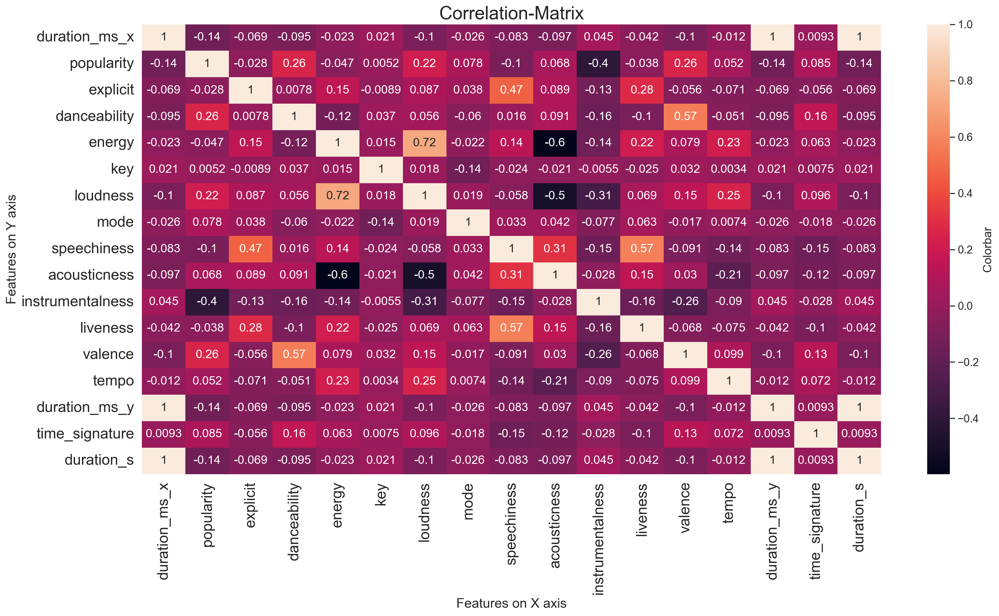

In [107]:
#correlation with all columns

sns.set_theme(style="white")

#generating a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

#setting up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 10),dpi=200)

#drawing the heatmap with the mask and correct aspect ratio
sns.set(font_scale=1.2)

heat_map = sns.heatmap(corr, annot=True, cbar_kws={'label': 'Colorbar'})
plt.ylabel('Features on Y axis',fontsize = 16)
plt.xlabel('Features on X axis',fontsize = 16)
heat_map.set_xticklabels(heat_map.get_xmajorticklabels(), fontsize = 18)
heat_map.set_yticklabels(heat_map.get_ymajorticklabels(), fontsize = 18)

plt.title('Correlation-Matrix', fontsize = 22)

## From Correlation matrix the observations are stated as:

1. energy and loudness have negative correlation with acousticness. Acousticness can be removed. But as per future analysis, this important feature 'acousticness' as an audio feature will be kept during the process.
2. loudness has strong positive correlation with energy. So, Loudness feature can be eliminated in feature engineering step.
3. duration_ms_x &
4. duration_ms_y features are available as redundant features which are extracted while fetching data from API twice can be eliminated during feature engineering.


### So, we will remove only ''Loudness'' for its high positive correlation with one feature and for better model observation.
### key,mode,explicit, duration_s, time_signature, energy, acousticness play somehow vital role in recognizing genre of a song , therefore these features are being kept.

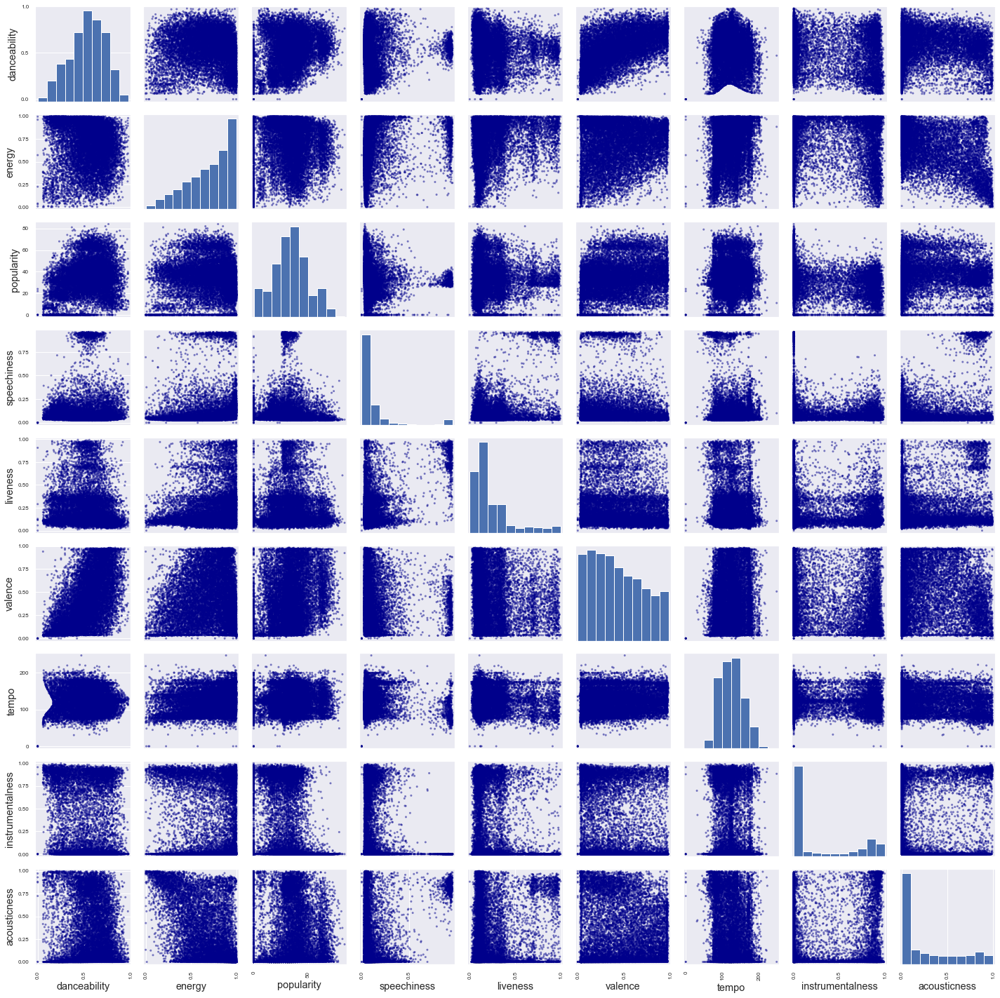

In [108]:
#scatter plot without 'key','mode','explicit','time_signature', 'duration_s' for other features being more variant
pd.plotting.scatter_matrix(df[['danceability','energy','popularity','speechiness','liveness','valence','tempo','instrumentalness','acousticness']],figsize=(20,20),color='darkblue')
plt.tight_layout();
plt.savefig('scatter_matrix.png')

# Feature Engineering

1. Dropping non-numeric or insignificant rows
2. Using Correlation Matrix: highly correlated feature's dropping

## 1. Dropping non-numeric or insignificant rows

The following features will be dropped or minimized from which are:

1. track_name
2. artist_name
3. album_name
4. duration_ms_x
5. track_id
6. artist_id
7. type
8. uri
9. track_href
10. analysis_url
11. duration_ms_y

In [109]:
df.drop(['track_name','artist_name','album_name','track_id','artist_id','duration_ms_x', 'type','uri','track_href',
         'analysis_url','duration_ms_y'], axis=1, inplace=True)

In [110]:
df.head()

,genre,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_s
0,country,64,0,0.591,0.703,10,-6.211,1,0.0256,0.043500,0.000002,0.1450,0.402,95.993,4,248.0
1,happy,37,0,0.509,0.927,11,-3.168,0,0.0682,0.000248,0.063900,0.1840,0.607,175.032,4,236.0
2,club,35,0,0.790,0.892,10,-6.515,0,0.0462,0.000536,0.672000,0.0455,0.408,126.011,4,206.0
3,country,63,0,0.559,0.766,11,-5.056,1,0.0295,0.010700,0.000070,0.1940,0.723,145.260,4,203.0
4,comedy,30,1,0.530,0.721,4,-11.488,1,0.9420,0.859000,0.000000,0.8780,0.213,92.675,4,274.0


## 2. Using Correlation Matrix:
highly correlated feature=loudness is being dropped

In [111]:
df.drop((['loudness']), axis=1, inplace=True)

## Loudness column is dropped only

In [112]:
df

,genre,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_s
0,country,64,0,0.591,0.703,10,1,0.0256,0.043500,0.000002,0.1450,0.4020,95.993,4,248.0
1,happy,37,0,0.509,0.927,11,0,0.0682,0.000248,0.063900,0.1840,0.6070,175.032,4,236.0
2,club,35,0,0.790,0.892,10,0,0.0462,0.000536,0.672000,0.0455,0.4080,126.011,4,206.0
3,country,63,0,0.559,0.766,11,1,0.0295,0.010700,0.000070,0.1940,0.7230,145.260,4,203.0
4,comedy,30,1,0.530,0.721,4,1,0.9420,0.859000,0.000000,0.8780,0.2130,92.675,4,274.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13986,iranian,0,0,0.461,0.438,5,0,0.6440,0.667000,0.000873,0.1300,0.0659,147.657,4,257.0
13987,country,63,0,0.543,0.837,11,1,0.0608,0.117000,0.000000,0.0872,0.5060,168.056,4,186.0
13988,black-metal,24,0,0.530,0.897,2,1,0.0341,0.000023,0.160000,0.2910,0.5070,126.999,4,192.0
13989,turkish,53,0,0.476,0.473,0,0,0.0397,0.397000,0.000007,0.0858,0.1550,76.171,4,183.0


In [113]:
df.shape

(13991, 15)

# Final Correlation matrix

In [114]:
corr_new=df.corr()

In [115]:
corr_new

,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_s
popularity,1.000000,-0.027541,0.259610,-0.047074,0.005237,0.077741,-0.102115,0.067578,-0.404176,-0.038423,0.259707,0.052215,0.085336,-0.138214
explicit,-0.027541,1.000000,0.007833,0.151703,-0.008930,0.037869,0.473379,0.088741,-0.125238,0.276692,-0.055849,-0.071458,-0.055718,-0.069245
danceability,0.259610,0.007833,1.000000,-0.122060,0.036940,-0.060429,0.015608,0.090534,-0.159790,-0.099708,0.567719,-0.051342,0.161376,-0.095019
energy,-0.047074,0.151703,-0.122060,1.000000,0.014636,-0.022499,0.136552,-0.598087,-0.139005,0.217390,0.078803,0.225111,0.062640,-0.023343
key,0.005237,-0.008930,0.036940,0.014636,1.000000,-0.137786,-0.023808,-0.021111,-0.005494,-0.025091,0.032040,0.003425,0.007506,0.020647
mode,0.077741,0.037869,-0.060429,-0.022499,-0.137786,1.000000,0.032727,0.041585,-0.077460,0.062542,-0.017410,0.007383,-0.017990,-0.026109
speechiness,-0.102115,0.473379,0.015608,0.136552,-0.023808,0.032727,1.000000,0.312748,-0.148326,0.571348,-0.091281,-0.139281,-0.146783,-0.082905
acousticness,0.067578,0.088741,0.090534,-0.598087,-0.021111,0.041585,0.312748,1.000000,-0.028017,0.153262,0.029506,-0.211512,-0.119583,-0.096561
instrumentalness,-0.404176,-0.125238,-0.159790,-0.139005,-0.005494,-0.077460,-0.148326,-0.028017,1.000000,-0.160673,-0.260903,-0.090264,-0.028299,0.045431
liveness,-0.038423,0.276692,-0.099708,0.217390,-0.025091,0.062542,0.571348,0.153262,-0.160673,1.000000,-0.068054,-0.075159,-0.100181,-0.042377


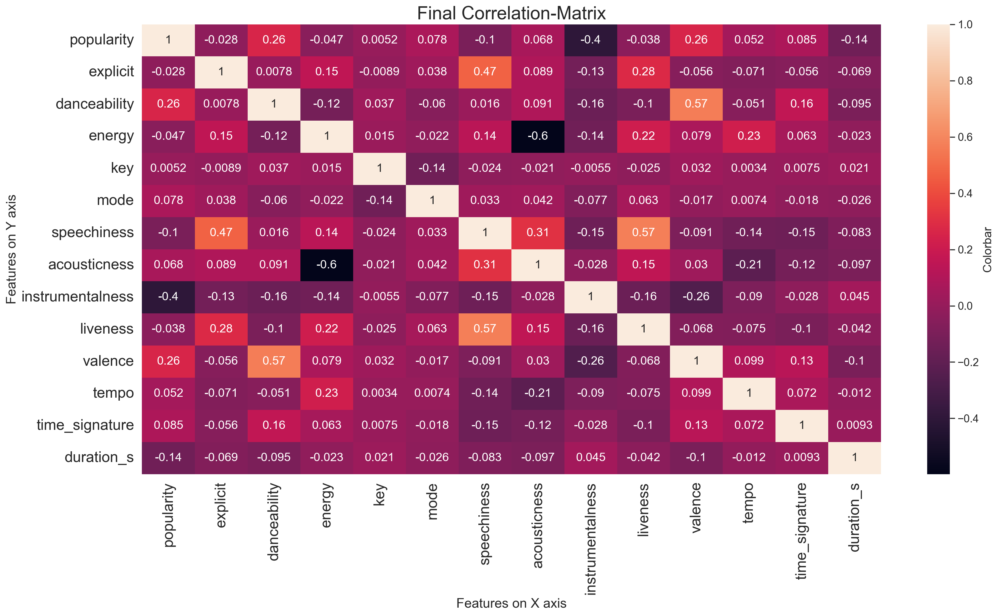

In [116]:
#correlation matrix with final columns/features

sns.set_theme(style="white")

#generating a mask for the upper triangle
mask = np.triu(np.ones_like(corr_new, dtype=bool))

#setting up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 10),dpi=200)

#drawing the heatmap with the mask and correct aspect ratio
sns.set(font_scale=1.2)

heat_map = sns.heatmap(corr_new, annot=True, cbar_kws={'label': 'Colorbar'})
plt.ylabel('Features on Y axis',fontsize = 16)
plt.xlabel('Features on X axis',fontsize = 16)
heat_map.set_xticklabels(heat_map.get_xmajorticklabels(), fontsize = 18)
heat_map.set_yticklabels(heat_map.get_ymajorticklabels(), fontsize = 18)

plt.title('Final Correlation-Matrix', fontsize = 22)
plt.savefig('final_correlation_matrix.png')

# Data Visualization

In [117]:
#visualizing
gen = df['genre'].value_counts().head(15).to_frame().reset_index()
gen.columns = ['genre','Count']

px.bar(gen.sort_values('Count'),
       x='Count', 
       y = 'genre',
       title = '15 Genres', 
       color_discrete_sequence =['green']*len(df),
       orientation = 'h')

In [118]:
import warnings
warnings.filterwarnings('ignore')

scaling only 'tempo' feature to have a look on only variant features with scaled value of tempo.
otherwise, tempo shows non-similarity(large numeric values) with other features

In [119]:
df['scaled_tempo'] = (df['tempo'] - min(df['tempo'])) / (max(df['tempo']) - min(df['tempo']))

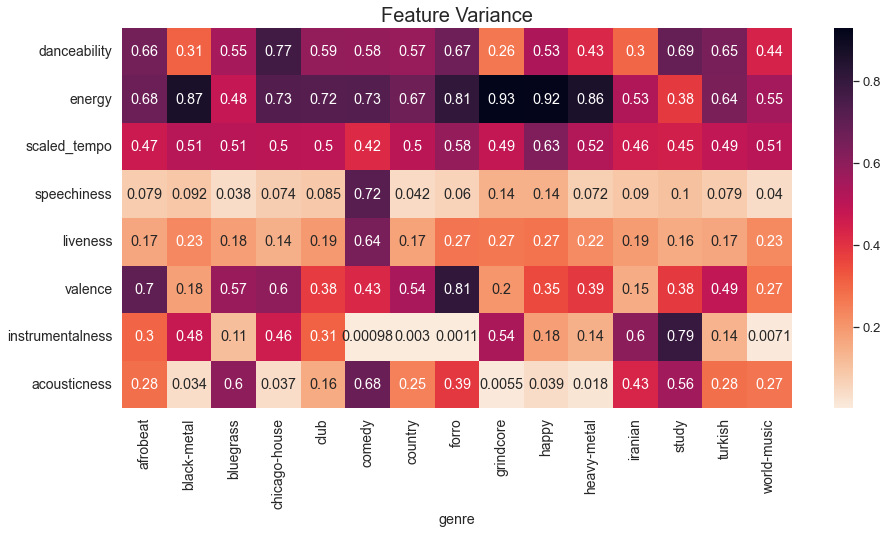

In [120]:
# group averaged song attributes for all features as named genres
features = ['danceability','energy','scaled_tempo', 'speechiness','liveness','valence','instrumentalness','acousticness']
group = df.groupby('genre')[features].mean()

#heatmap of most variant attributes
g = group.pivot_table(columns=group.index)

#heatmap with variant features
plt.figure(figsize=(15, 7));
plt.title('Feature Variance', fontsize=20);
ax.set_ylim(-20, 20);
plt.xticks(fontsize=14);
plt.yticks(fontsize=14);
sns.heatmap(g.loc[['danceability','energy','scaled_tempo','speechiness','liveness','valence','instrumentalness','acousticness']],annot=True, cmap='rocket_r');
plt.savefig('feature variance.png', bbox_inches='tight')

Commnet on above figure:

afrobeat genre songs: more valenceful(happy) and more danceable <br>
black-metal genre songs: more energetic <br>
bluegrass genre songs: more valenceful(happy) <br>
chicago-house genre songs: highest danceable and more energetic <br>
club genre songs: more energetic <br>
comedy genre songs: more acousticness with more energy and speechful with high liveness <br>
country genre songs: more energetic and and danceable <br>
forro genre songs: both energetic and highest valence and highest tempo <br>
grindcore genre songs: highest energetic <br>
happy genre songs: second highest energetic <br>
heavy-metal genre songs: energetic <br>
iranian genre songs:more instrumentalful <br>
study genre songs: highest instrumentalful <br>
turkish genre songs: danceable <br>
world-music genre songs: moderate energetic <br>

In [121]:
#dropping scaled_tempo again
df.drop((['scaled_tempo']), axis=1, inplace=True)

In [122]:
df.head()

,genre,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_s
0,country,64,0,0.591,0.703,10,1,0.0256,0.043500,0.000002,0.1450,0.402,95.993,4,248.0
1,happy,37,0,0.509,0.927,11,0,0.0682,0.000248,0.063900,0.1840,0.607,175.032,4,236.0
2,club,35,0,0.790,0.892,10,0,0.0462,0.000536,0.672000,0.0455,0.408,126.011,4,206.0
3,country,63,0,0.559,0.766,11,1,0.0295,0.010700,0.000070,0.1940,0.723,145.260,4,203.0
4,comedy,30,1,0.530,0.721,4,1,0.9420,0.859000,0.000000,0.8780,0.213,92.675,4,274.0


tempo feature is scaled for better visualization in heatmap. In next steps, this will be scaled through pipeline of StandardScalar.
That is why removing scaled_tempo column from main dataset.

In [123]:
dataset=df.to_csv('group7_15_final_genre_dataset.csv')

# Histogramify

In [124]:
def binary_mean(x): # just creates an average between two sample-points to make the x and y array of np.histogram fit
    re = np.array([])
    for i in range(len(x)-1):
        ph = (x[i]+x[i+1])/2
        re = np.append(re, ph)
    return re
        
def mov_av_hist(x, y, depth): # a simple moving average filter to smooth out fluctuations in the plot
    re1 = np.array([])
    re2 = np.array([])
    for i in range(len(y)-depth+1):
        ph1 = 0
        ph2 = 0
        for j in range(depth):
            ph1 = ph1 + x[i+j]
            ph2 = ph2 + y[i+j]
        ph1 = ph1/depth
        ph2 = ph2/depth
        re1 = np.append(re1, ph1)
        re2 = np.append(re2, ph2)
    res = np.array([re1, re2])
    return res

In [125]:
def hist_ensemble(dataset, N_classes, feature, bins, smooth): # creates a plot of smoothed histograms for each genre
    plt.figure(figsize =(16,8))

    for i in range(N_classes):
        h = np.histogram(dataset[dataset['genre']==i][feature], bins)
        sh = mov_av_hist(binary_mean(h[1]), h[0], smooth)
        sh = mov_av_hist(sh[0], sh[1], smooth)
        plt.plot(sh[0], sh[1], label=encoded_genres()[i])

    plt.title(feature)
    plt.legend()
    plt.grid()

In [126]:
# simply show the assigning of the label encoder for each genre

from sklearn.preprocessing import LabelEncoder

Y=df['genre']
Y_encoded = LabelEncoder().fit_transform(Y)

def encoded_genres():
    l = np.array([])
    for a in range(len(pd.Series(Y_encoded).value_counts())):
        for i in range(len(Y)):
            if Y_encoded[i]==a:
                l = np.append(l, Y[i])
#                 print(a,' means: ',Y[i])
                break
    return l

print('An encoded version of the genre-target was made')            
print()

print(encoded_genres())

print()
print('Its visible, that the class numbers are assigned in an alphabetical order.')

An encoded version of the genre-target was made

['afrobeat' 'black-metal' 'bluegrass' 'chicago-house' 'club' 'comedy'
 'country' 'forro' 'grindcore' 'happy' 'heavy-metal' 'iranian' 'study'
 'turkish' 'world-music']

Its visible, that the class numbers are assigned in an alphabetical order.


In [127]:
#creates a label-encoded copy of original dataset

ds_encoded = df.copy() 
ds_encoded['genre'] = LabelEncoder().fit_transform(df['genre'])
ds_encoded

,genre,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_s
0,6,64,0,0.591,0.703,10,1,0.0256,0.043500,0.000002,0.1450,0.4020,95.993,4,248.0
1,9,37,0,0.509,0.927,11,0,0.0682,0.000248,0.063900,0.1840,0.6070,175.032,4,236.0
2,4,35,0,0.790,0.892,10,0,0.0462,0.000536,0.672000,0.0455,0.4080,126.011,4,206.0
3,6,63,0,0.559,0.766,11,1,0.0295,0.010700,0.000070,0.1940,0.7230,145.260,4,203.0
4,5,30,1,0.530,0.721,4,1,0.9420,0.859000,0.000000,0.8780,0.2130,92.675,4,274.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13986,11,0,0,0.461,0.438,5,0,0.6440,0.667000,0.000873,0.1300,0.0659,147.657,4,257.0
13987,6,63,0,0.543,0.837,11,1,0.0608,0.117000,0.000000,0.0872,0.5060,168.056,4,186.0
13988,1,24,0,0.530,0.897,2,1,0.0341,0.000023,0.160000,0.2910,0.5070,126.999,4,192.0
13989,13,53,0,0.476,0.473,0,0,0.0397,0.397000,0.000007,0.0858,0.1550,76.171,4,183.0


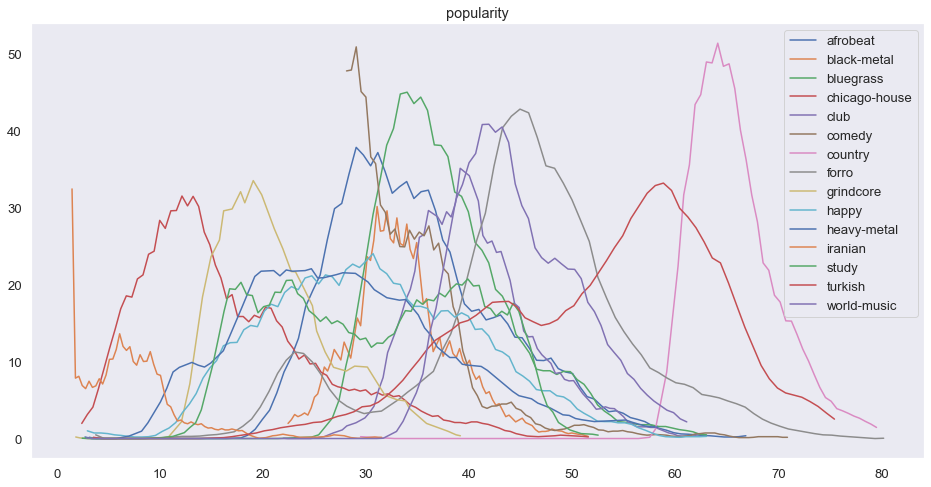

In [128]:
hist_ensemble(ds_encoded, 15, 'popularity', 100, 5)
plt.savefig('popularity.png', bbox_inches='tight')

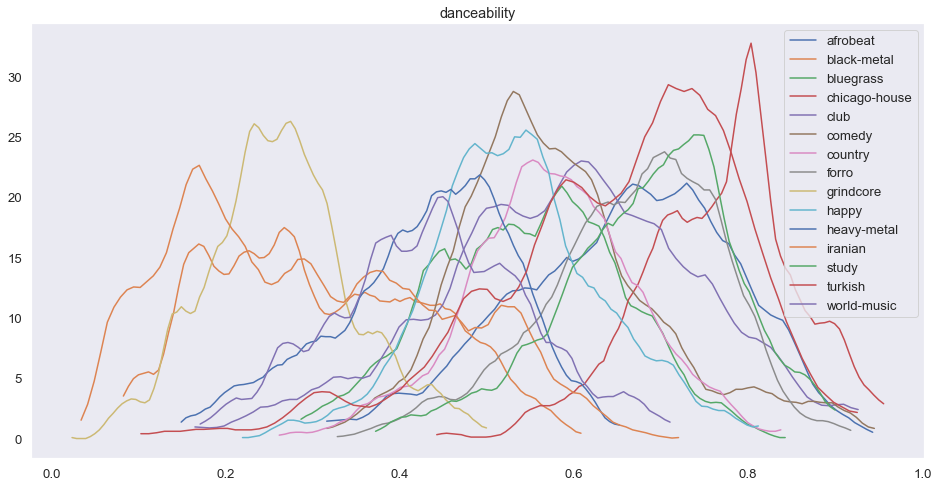

In [129]:
hist_ensemble(ds_encoded, 15, 'danceability', 100, 5)
plt.savefig('danceability.png', bbox_inches='tight')

##### Danceability: 
Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

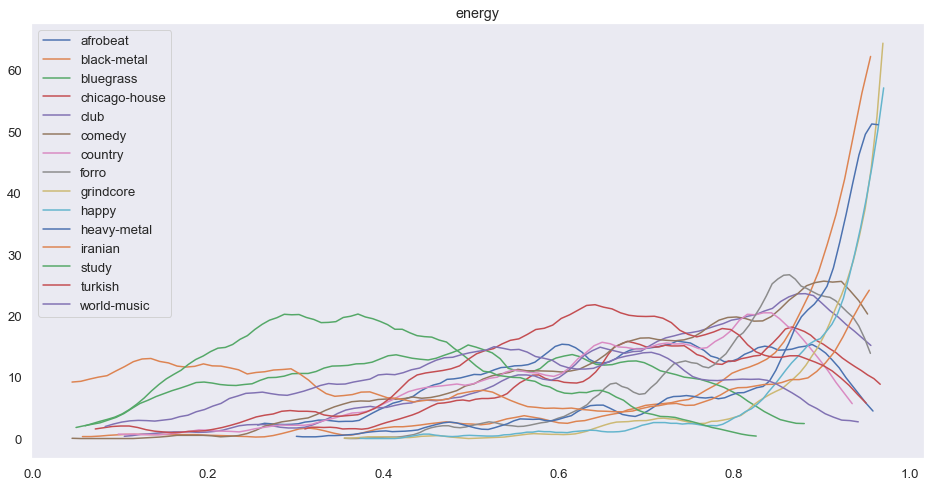

In [130]:
hist_ensemble(ds_encoded, 15, 'energy', 100, 5)
plt.savefig('energy.png', bbox_inches='tight')

##### Energy: 
Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy.

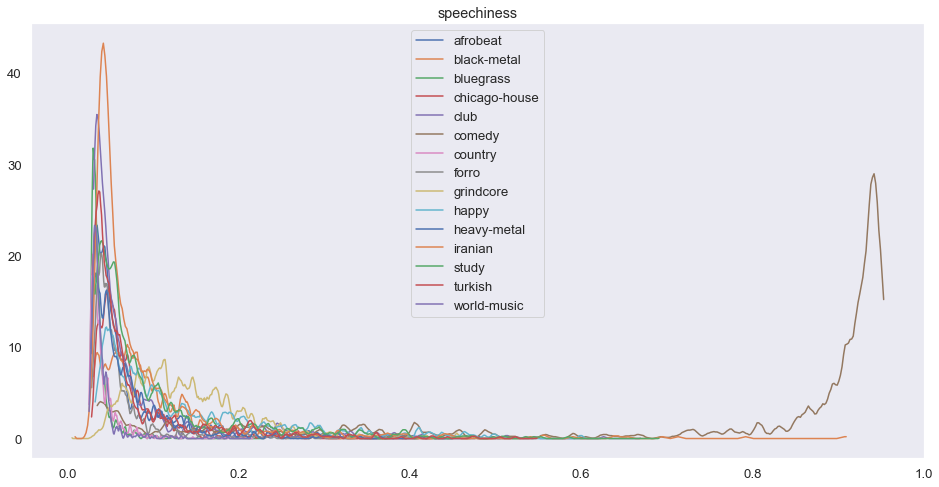

In [131]:
hist_ensemble(ds_encoded, 15, 'speechiness', 500, 5)
plt.savefig('speechiness.png', bbox_inches='tight')

##### Speechiness: 
Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value.

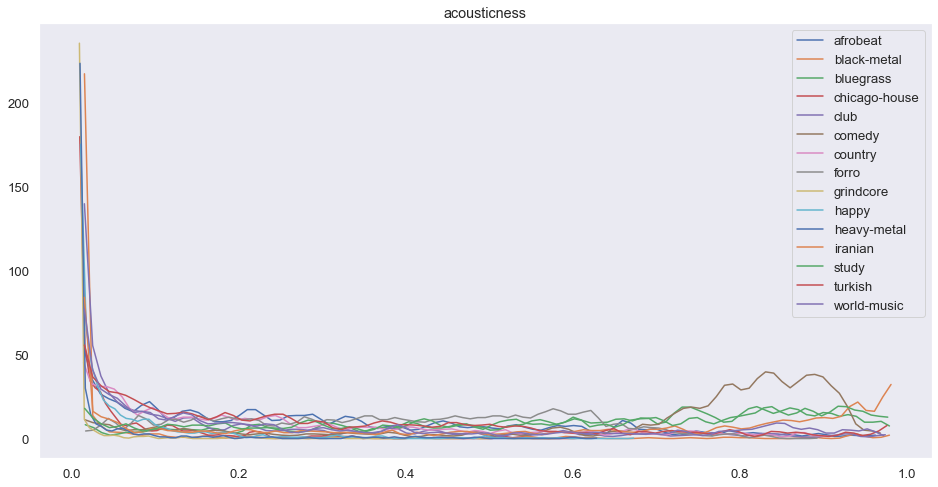

In [132]:
hist_ensemble(ds_encoded, 15, 'acousticness', 100, 2)
plt.savefig('acousticness.png', bbox_inches='tight')

##### Acousticness:
A measure from 0.0 to 1.0 of whether the track is acoustic.

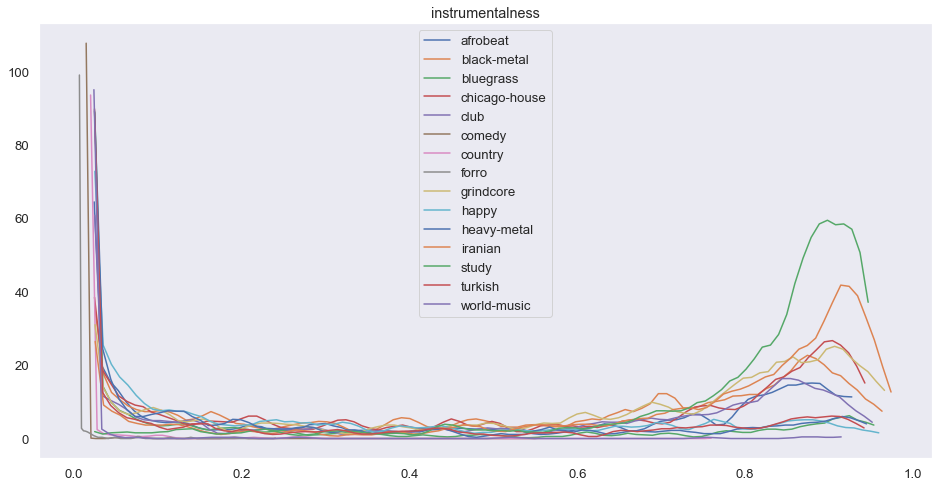

In [133]:
hist_ensemble(ds_encoded, 15, 'instrumentalness', 100, 3)
plt.savefig('intrumentalness.png', bbox_inches='tight')

##### Instrumentalness:
Predicts whether a track contains no vocals. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content.

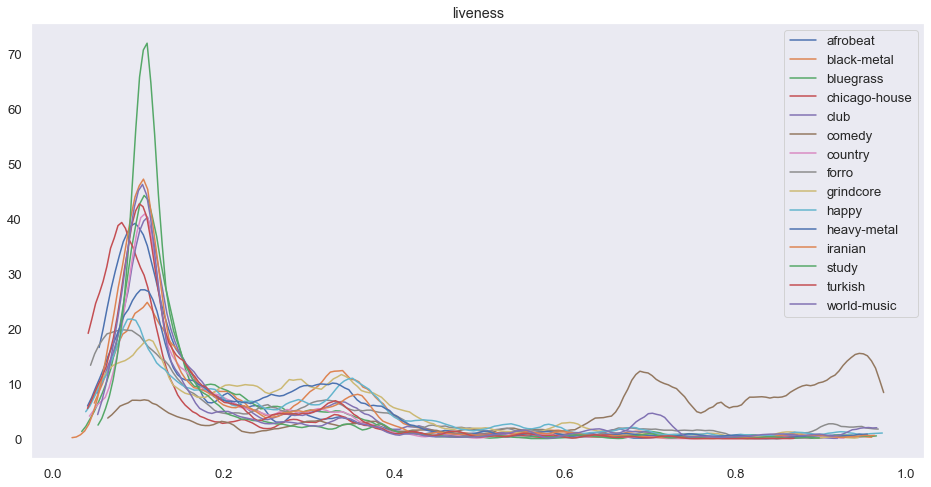

In [134]:
hist_ensemble(ds_encoded, 15, 'liveness', 200, 5)
plt.savefig('liveness.png', bbox_inches='tight')

##### Liveness:
Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live.

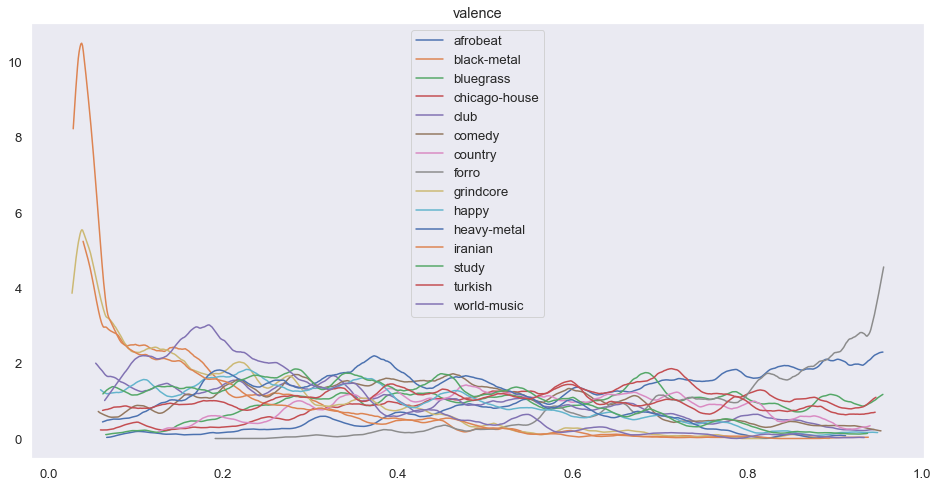

In [135]:
hist_ensemble(ds_encoded, 15, 'valence', 1000,30)
plt.savefig('valence.png', bbox_inches='tight')

##### Valence: 
A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

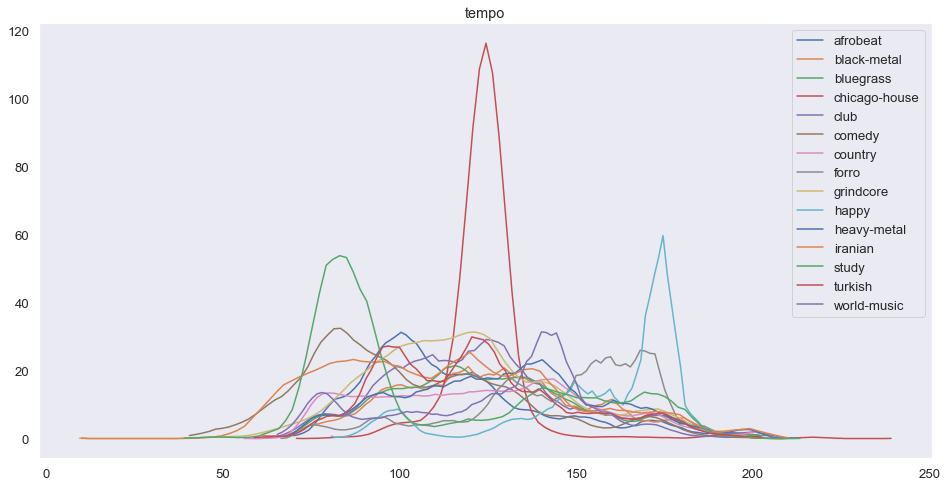

In [136]:
hist_ensemble(ds_encoded, 15, 'tempo', 100,5)
plt.savefig('tempo.png', bbox_inches='tight')

##### Tempo: 
The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.

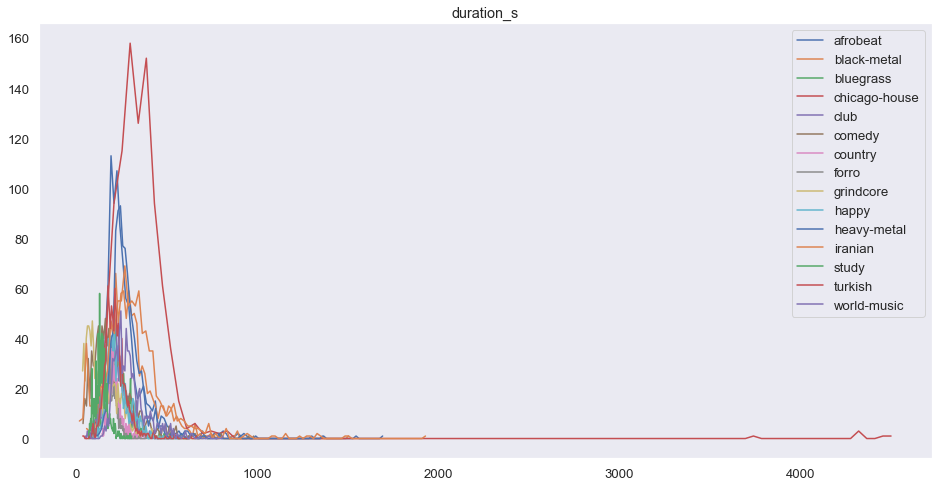

In [137]:
hist_ensemble(ds_encoded, 15, 'duration_s', 100, 1)
plt.savefig('duration_s.png', bbox_inches='tight')

In [ ]:
hist_ensemble(ds_encoded, 15, 'key', 100, 1)
plt.savefig('key.png', bbox_inches='tight')

##### key:
key is the major or minor scale around which a piece of music revolves. A song in a major key is based on a major scale. A song in a minor key is based on a minor scale.

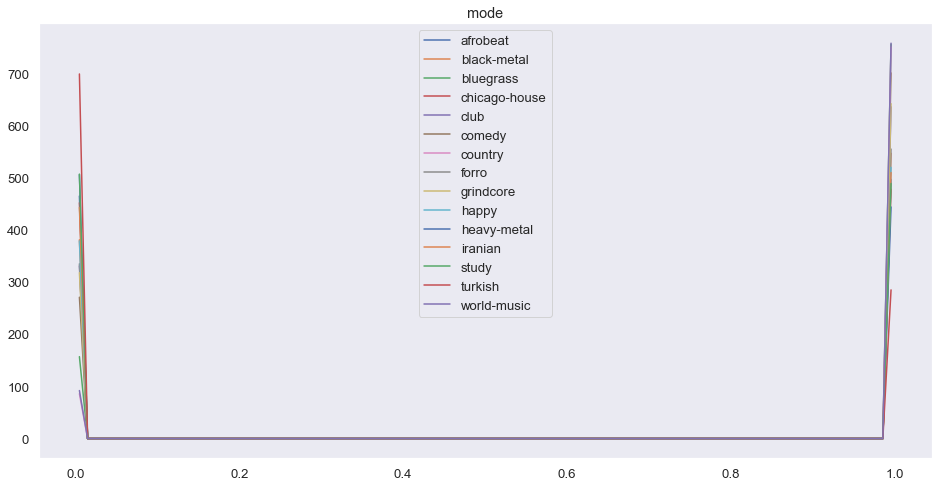

In [139]:
hist_ensemble(ds_encoded, 15, 'mode', 100, 1)
plt.savefig('mode.png', bbox_inches='tight')

##### Mode:
Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

In [140]:
#just to look at very large songs
df[df['duration_s']>=1000].head(10)

,genre,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_s
465,black-metal,36,0,0.464,0.02020,11,1,0.0346,0.991000,0.872,0.0945,0.1210,98.268,4,1511.0
1144,chicago-house,12,0,0.615,0.93500,11,0,0.0560,0.001320,0.448,0.8960,0.3470,131.969,4,4340.0
1161,iranian,0,1,0.148,0.44700,5,1,0.1050,0.921000,0.142,0.1130,0.0678,74.969,3,1482.0
1602,iranian,3,0,0.247,0.40800,7,0,0.0376,0.151000,0.703,0.2420,0.0435,139.765,4,1235.0
2251,iranian,4,0,0.403,0.13400,7,0,0.0421,0.995000,0.874,0.0961,0.0388,120.132,4,1268.0
2259,iranian,1,0,0.269,0.60500,8,0,0.2470,0.906000,0.611,0.1190,0.0365,119.101,3,1149.0
3344,heavy-metal,22,0,0.278,0.70700,7,1,0.0372,0.000416,0.662,0.1460,0.2630,112.185,4,1365.0
3838,iranian,0,0,0.327,0.06590,5,1,0.0484,0.965000,0.556,0.0977,0.0386,137.993,4,1086.0
4153,iranian,0,0,0.160,0.00246,7,1,0.0506,0.612000,0.463,0.2610,0.0230,129.342,4,1332.0
4424,iranian,0,0,0.266,0.31100,1,1,0.0486,0.057600,0.373,0.0994,0.0351,122.001,4,1149.0


In [141]:
df.shape

(13991, 15)

### We will be keeping all these features and having total 13991 datapoints and total 15 coloumns in total.

In [142]:
df.describe()

,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_s
count,13991.000000,13991.00000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000,13991.000000
mean,34.213280,0.09985,0.532914,0.699065,5.392895,0.612465,0.125868,0.269874,0.278418,0.235059,0.427822,123.991152,3.899435,241.501465
std,16.464799,0.29981,0.190415,0.242019,3.547606,0.487205,0.196894,0.321476,0.372960,0.214490,0.273126,30.998465,0.434363,144.563306
min,0.000000,0.00000,0.000000,0.000020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000
25%,24.000000,0.00000,0.408000,0.534000,2.000000,0.000000,0.037700,0.002120,0.000001,0.099150,0.193000,99.953000,4.000000,171.000000
50%,34.000000,0.00000,0.546000,0.751000,6.000000,1.000000,0.055900,0.097100,0.006100,0.139000,0.392000,123.489000,4.000000,220.000000
75%,44.000000,0.00000,0.678000,0.908000,9.000000,1.000000,0.110000,0.519500,0.705000,0.306000,0.645000,144.998500,4.000000,284.000000
max,84.000000,1.00000,0.981000,1.000000,11.000000,1.000000,0.962000,0.996000,0.999000,0.995000,0.983000,247.337000,5.000000,4523.000000


# More Data Visualization of taken features

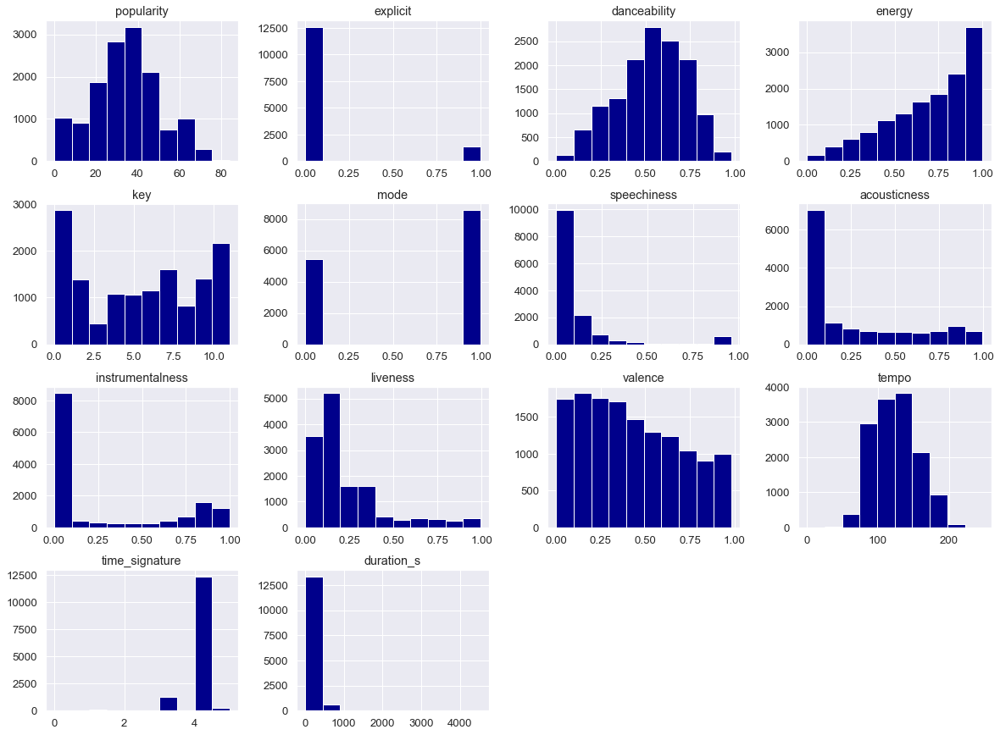

In [143]:
df.hist(figsize=(20,15), color='DarkBlue');
plt.savefig('histogram.png')

# Different Machine Learning models implementation

## Label Encodeing
can be used to normalize labels. It can also be used to transform non-numerical labels for example: genre-name of songs to numerical labels. 

In [144]:
from sklearn.preprocessing import LabelEncoder

# Initializing X=training dataset, Y=test dataset

In [145]:
Y=df['genre']
X=df.drop('genre',axis=1)

In [146]:
Y

0            country
1              happy
2               club
3            country
4             comedy
            ...     
13986        iranian
13987        country
13988    black-metal
13989        turkish
13990        turkish
Name: genre, Length: 13991, dtype: object

In [160]:
Y_encoded = LabelEncoder().fit_transform(Y)

def encoded_genres():
    l = np.array([])
    for a in range(len(pd.Series(Y_encoded).value_counts())):
        for i in range(len(Y)):
            if Y_encoded[i]==a:
                l = np.append(l, Y[i])
                print(a,' means: ',Y[i])
                break
    return l
enc_gen = encoded_genres()
print(enc_gen)

0  means:  afrobeat
1  means:  black-metal
2  means:  bluegrass
3  means:  chicago-house
4  means:  club
5  means:  comedy
6  means:  country
7  means:  forro
8  means:  grindcore
9  means:  happy
10  means:  heavy-metal
11  means:  iranian
12  means:  study
13  means:  turkish
14  means:  world-music
['afrobeat' 'black-metal' 'bluegrass' 'chicago-house' 'club' 'comedy'
 'country' 'forro' 'grindcore' 'happy' 'heavy-metal' 'iranian' 'study'
 'turkish' 'world-music']


In [161]:
Y_encoded

array([ 6,  9,  4, ...,  1, 13, 13])

# Splitting Dataset into training and test set

In [162]:
from sklearn.model_selection import train_test_split

In [163]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_encoded, test_size=0.2, random_state=42, stratify=Y_encoded)
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((11192, 14), (2799, 14), (11192,), (2799,))

# 1. Logistic Regression Classifier

In [164]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

# Training and evaluating the model

Training Logistic Regression model and evaluating on test dataset

In [165]:
# Importing logistic regression algorithm from sklearn
log = LogisticRegression()

In [166]:
# trainig the algorithm with training data
log_model=log.fit(X_train, Y_train)

#On test dataset, measuring accuracy 
score= log.score(X_test,Y_test)
print(f'Accuracy (test) = {score}')

Accuracy (test) = 0.3386923901393355


Accuracy = Number of correct predictions divided by Total number of predictions.


On test dataset, accuracy is 33.86 % initially.

# Better evaluation using Cross-Validation

1. cross_val_score will be used to get an estimation of our model. It returns evaluation score.
2. cross_val_predict will be used to get a measure of accuracy of performance. It doesn't return evaluation score.
It returns predictions made on each fold. So we get clean predictions for each instance in the training set.

Cross Validation will randomly split the training set into 10 distinct subsets called folds, then it trains and evaluates/tests the model 10 times by picking a different fold for evaluation each time and training on other 9 folds.

## Cross-validation without hyperparameter tuning

In [167]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

In [169]:
#Using the StratfiedKFold as cross validation feature
cv=StratifiedKFold(10,shuffle=True, random_state=42)

log = LogisticRegression()
log_model=log.fit(X_train, Y_train)
accuracy=cross_val_score(log_model,X_train,Y_train, scoring='accuracy', cv=cv, n_jobs=-1)
print("Accuracy of Logistic Regression Model with Cross Validation is:",accuracy.mean() * 100)

Accuracy of Logistic Regression Model with Cross Validation is: 34.02420049789353


## Confusion matrix, precision,recall, accuracy without hyper parameter tuning

In [170]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

## Confusion matrix on both training and test sets without hyperparameter tuning

Accuracy on training dataset:  0.3416726233023588
Accuracy on test dataset:  0.3386923901393355


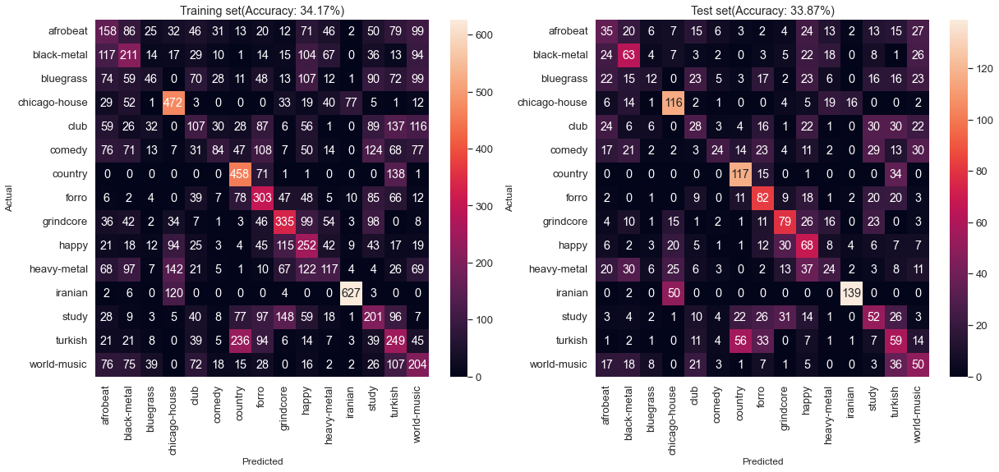

In [172]:
#Confusion matrix
log=LogisticRegression()
log_model=log.fit(X_train,Y_train)

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,8))

#training set
Y_train_pred=log_model.predict(X_train)
train_accuracy=accuracy_score(Y_train, Y_train_pred)
print('Accuracy on training dataset: ', accuracy_score(Y_train,Y_train_pred))
sns.heatmap(confusion_matrix(Y_train,Y_train_pred), annot=True,fmt='d', yticklabels=enc_gen,xticklabels=enc_gen,ax=ax1)
ax1.set_title(f'Training set(Accuracy: {round(train_accuracy*100,2)}%)')
ax1.set_xlabel('Predicted',fontsize=12)
ax1.set_ylabel('Actual',fontsize=12);

#test set
Y_test_pred=log_model.predict(X_test)
test_accuracy=accuracy_score(Y_test,Y_test_pred)
print('Accuracy on test dataset: ', accuracy_score(Y_test,Y_test_pred))
sns.heatmap(confusion_matrix(Y_test,Y_test_pred), annot=True,fmt='d',yticklabels=enc_gen,xticklabels=enc_gen,ax=ax2)
ax2.set_title(f'Test set(Accuracy: {round(test_accuracy*100,2)}%)')
ax2.set_xlabel('Predicted',fontsize=12)
ax2.set_ylabel('Actual',fontsize=12);

As it is observed, initially training set accuracy is about 34.17% and test set accuracy is found to be of 33.87%

# Hyper Parameter Tuning

In [174]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import KFold
from sklearn import set_config
import time

# Fine Tuning with Grid Search

### 1. using SMOTE() to overcome imbalanced dataset outside of Pipeline
### 2. using StandardScaler() to scale feature values within pipeline
### 3. using PCA() to remove all the features that are correlated within pipeline

Class= country, n= 837 (5.98%)
Class= happy, n= 899 (6.43%)
Class= club, n= 967 (6.91%)
Class= comedy, n= 972 (6.95%)
Class= forro, n= 890 (6.36%)
Class= chicago-house, n= 930 (6.65%)
Class= world-music, n= 850 (6.08%)
Class= bluegrass, n= 913 (6.53%)
Class= afrobeat, n= 962 (6.88%)
Class= iranian, n= 953 (6.81%)
Class= study, n= 996 (7.12%)
Class= heavy-metal, n= 950 (6.79%)
Class= turkish, n= 984 (7.03%)
Class= black-metal, n= 928 (6.63%)
Class= grindcore, n= 960 (6.86%)


<BarContainer object of 15 artists>

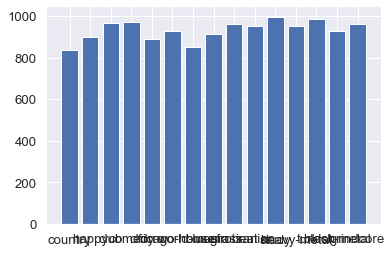

In [178]:
#class imbalance was noticed

from collections import Counter
counter = Counter(Y)
for k,v in counter.items():
    per = v / len(Y) * 100
    print(f'Class= {k}, n= {v} ({per:.2f}%)')
    
fig, ax = plt.subplots()
ax.bar(counter.keys(), counter.values())

To balance the dataset is highly significant part of data preprocessing. Data imbalance denotes to when the classes(genres in our case) in the dataset are not equally distributed as it is observed in previous cell which ultimately results in poor accuracy along with risks to train the models. To work with imbalanced dataset, we need to balance the training dataset only, not the test dataset. We will apply SMOTE() for oversampling the training dataset to balance the training dataset.

### Over-sampling using SMOTE( Synthetic Minority Over-sampling Technique)

Over-sampling:(reference)

Advantages:

Unlike under-sampling, this method leads to no information loss
and Outperforms under-sampling

In [179]:
#using smote function to balance imbalanced training dataset
smote = SMOTE(random_state = 42)
X_train_smote, Y_train_smote = smote.fit_resample(X_train, Y_train)

In [183]:
#using pipeline to enable data to be transformed and correlated into a model
steps = [('reduce_dim', PCA()),('mapper',StandardScaler()), ('classifier', LogisticRegression(random_state=42, max_iter=3000))]
pipe = Pipeline(steps)

#set of several parameters with different values
param_grid = [
    { 'classifier' : [LogisticRegression()],
     'classifier__penalty' : ['l1', 'l2'],
    'classifier__C' : [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'classifier__solver' : ['liblinear','newton-cg', 'lbfgs', 'sag', 'saga']}]

#using k-folds=3
kfold = KFold(n_splits=3,shuffle=True,random_state=42)
    
#gridsearchcv with pipeline, parameters and cross validation parameters etc
grid_search_lr = GridSearchCV(estimator=pipe,
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=kfold,
                           n_jobs=-1)

grid_search_lr.fit(X_train_smote, Y_train_smote) #using balanced training dataset

GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('reduce_dim', PCA()),
                                       ('mapper', StandardScaler()),
                                       ('classifier',
                                        LogisticRegression(max_iter=3000,
                                                           random_state=42))]),
             n_jobs=-1,
             param_grid=[{'classifier': [LogisticRegression(C=100,
                                                            solver='newton-cg')],
                          'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                          'classifier__penalty': ['l1', 'l2'],
                          'classifier__solver': ['liblinear', 'newton-cg',
                                                 'lbfgs', 'sag', 'saga']}],
             scoring='accuracy')

In [184]:
start_time = time.time()

print('Best Score for Logistic Regression model:\n %s' % grid_search_lr.best_estimator_)
print('Best Hyperparameters for Logistic Regression model:\n %s' % grid_search_lr.best_params_)

# computation of time
comp_time_gs = time.time() - start_time
print("--- Computation time for grid search: %s seconds ---" % comp_time_gs)

cv_score = grid_search_lr.best_score_
test_score = grid_search_lr.score(X_test, Y_test)
print(f'Cross-validation score on training set: {cv_score} \nTest score on test set: {test_score}')

Best Score for Logistic Regression model:
 Pipeline(steps=[('reduce_dim', PCA()), ('mapper', StandardScaler()),
                ('classifier', LogisticRegression(C=100, solver='newton-cg'))])
Best Hyperparameters for Logistic Regression model:
 {'classifier': LogisticRegression(C=100, solver='newton-cg'), 'classifier__C': 100, 'classifier__penalty': 'l2', 'classifier__solver': 'newton-cg'}
--- Computation time for grid search: 0.0009999275207519531 seconds ---
Cross-validation score on training set: 0.731827687160184 
Test score on test set: 0.7352625937834941


# Pipeline used for Logistic Regression Model

In [185]:
set_config(display="diagram")
grid_search_lr

GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('reduce_dim', PCA()),
                                       ('mapper', StandardScaler()),
                                       ('classifier',
                                        LogisticRegression(max_iter=3000,
                                                           random_state=42))]),
             n_jobs=-1,
             param_grid=[{'classifier': [LogisticRegression(C=100,
                                                            solver='newton-cg')],
                          'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                          'classifier__penalty': ['l1', 'l2'],
                          'classifier__solver': ['liblinear', 'newton-cg',
                                                 'lbfgs', 'sag', 'saga']}],
             scoring='accuracy')

# Optimized Logistic Regression Model

In [186]:
#gridsearch suggests to use following hyperparametrs 
    
LogisticRegression(
    penalty='l2', 
    C=100,
    random_state=42, 
    solver='newton-cg', 
    max_iter=3000, 
    multi_class='ovr', 
    n_jobs=-1
)

LogisticRegression(C=100, max_iter=3000, multi_class='ovr', n_jobs=-1,
                   random_state=42, solver='newton-cg')

# Retraining Logistic regression model
with best hyper parameters with pipelines

In [187]:
steps = [("reduce_dim", PCA()),('mapper',StandardScaler()), ("classifier", LogisticRegression(
    penalty='l2', 
    C=100,
    random_state=42, 
    solver='newton-cg', 
    max_iter=3000, 
    multi_class='ovr', 
    n_jobs=-1
))]

pipe_lr = Pipeline(steps)

final_log=pipe_lr.fit(X_train_smote, Y_train_smote)

# Confusion matrix for Optimized Logistic Regression Model

Train Accuracy for Logistic Regression model:
 0.7124215809284818
Test Accuracy for Logistic Regression model:
 0.7081100392997499


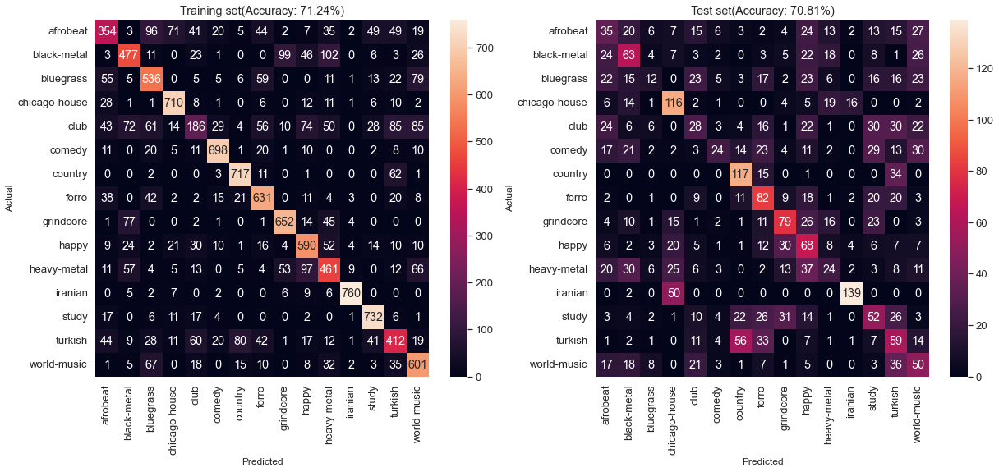

In [189]:
#Confusion matrix for optimized logistic regression model

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,8))

#training set
Y_train_pred_lr=final_log.predict(X_train_smote)
train_accuracy=accuracy_score(Y_train_smote, Y_train_pred_lr)
print('Train Accuracy for Logistic Regression model:\n %s' % train_accuracy)
sns.heatmap(confusion_matrix(Y_train_smote,Y_train_pred_lr), annot=True,fmt='d', yticklabels=enc_gen,xticklabels=enc_gen,ax=ax1)
ax1.set_title(f'Training set(Accuracy: {round(train_accuracy*100,2)}%)')
ax1.set_xlabel('Predicted',fontsize=12)
ax1.set_ylabel('Actual',fontsize=12);

#test set
Y_test_pred_lr=final_log.predict(X_test)
test_accuracy=accuracy_score(Y_test,Y_test_pred_lr)
print('Test Accuracy for Logistic Regression model:\n %s' % test_accuracy)
sns.heatmap(confusion_matrix(Y_test,Y_test_pred), annot=True,fmt='d',yticklabels=enc_gen,xticklabels=enc_gen,ax=ax2)
ax2.set_title(f'Test set(Accuracy: {round(test_accuracy*100,2)}%)')
ax2.set_xlabel('Predicted',fontsize=12)
ax2.set_ylabel('Actual',fontsize=12);

plt.savefig('training set_logisticregression.png', bbox_inches='tight')
plt.savefig('test set_logisticregression.png', bbox_inches='tight')

For tuned Logistic Regression Model:

Accuracy on training set is 71.24% and on test set is 70.81%

# Classification Report

In [191]:
Y_true_lr, Y_pred_lr = Y_test, final_log.predict(X_test)
print('Classification report on final tuned test set:\n %s' %classification_report(Y_true_lr, Y_pred_lr))
print()

Classification report on final tuned test set:
               precision    recall  f1-score   support

           0       0.64      0.43      0.52       192
           1       0.61      0.56      0.58       186
           2       0.66      0.72      0.69       183
           3       0.82      0.89      0.85       186
           4       0.51      0.30      0.38       193
           5       0.84      0.86      0.85       195
           6       0.84      0.90      0.87       167
           7       0.70      0.79      0.74       178
           8       0.82      0.79      0.80       192
           9       0.57      0.75      0.65       180
          10       0.51      0.55      0.53       190
          11       0.98      0.94      0.96       191
          12       0.81      0.94      0.87       199
          13       0.63      0.58      0.60       197
          14       0.59      0.66      0.62       170

    accuracy                           0.71      2799
   macro avg       0.70      0.7

## Final Accuracy: 
## For Logistic Regression Model 
## Accuracy on training set is 71.24% and on test set is 70.81% 

# 2. K-Nearest Neighbor Classifier

In [192]:
from sklearn.neighbors import KNeighborsClassifier

In [193]:
knn = KNeighborsClassifier()
knn.fit(X_train, Y_train)
print(f'Accuracy(test) = {knn.score(X_test, Y_test)}')

Accuracy(test) = 0.4190782422293676


# Best k's value for KNN model

In [194]:
#using smote function for KNN also to balance imbalanced training dataset through oversampling

In [195]:
# Looking at different numbers of nearest neighbors
max_k = 0
max_score = 0
for k in range(1,50):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_smote, Y_train_smote)
    score = knn.score(X_test, Y_test)
    #print(f'k = {k}, accuracy = {score}')
    if score > max_score:
        max_k = k
        max_score = score
        
print(f'Best k value = {max_k}, Accuracy on test set = {max_score}')

Best k value = 21, Accuracy on test set = 0.44694533762057875


In [196]:
#using pipeline to enable data to be transformed and correlated into a model
#PCA will help remove all the features that are correlated, known as multi-collinearity(ref)
#StandardScaler is used to resize the distribution of values,so that the mean of the observed values is 0 and the standard deviation is 1

steps = [("reduce_dim", PCA()),('mapper',StandardScaler()), ("classifier", KNeighborsClassifier())]
pipe = Pipeline(steps)

#set of several parameters with different values to get optimal hyperparameters
param_grid = [
    { 'classifier' : [KNeighborsClassifier()],
     'classifier__weights' : ['distance', 'uniform'],
     'classifier__n_neighbors' : [3,5,7,9,12,14,16,18,20],
     'classifier__leaf_size': [30,40], 
     'classifier__metric': ['minkowski']
    }]

#using k-folds=3
#It helps us better use data, and it gives much more information about algorithm performance
kfold = KFold(n_splits=3,shuffle=True,random_state=42)
    
#Grid-search for knn
#Grid-search is used to find the optimal hyperparameters of a model which results in the most accurate predictions(ref)
grid_search_knn = GridSearchCV(estimator=pipe,
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=kfold,
                           n_jobs=-1)

#training model with training dataset
grid_search_knn.fit(X_train_smote, Y_train_smote)

start_time = time.time()
print('Best Score for Logistic Regression model: %s' % grid_search_knn.best_estimator_)
print('Best Hyperparameters for Logistic Regression model: %s' % grid_search_knn.best_params_)

# computation of time
comp_time_gs = time.time() - start_time
print("--- Computation time for grid search: %s seconds ---" % comp_time_gs)


cv_score = grid_search_knn.best_score_
test_score = grid_search_knn.score(X_test, Y_test)
print(f'Cross-validation score on training set: {cv_score} \nTest score on test set: {test_score}')

Best Score for Logistic Regression model: Pipeline(steps=[('reduce_dim', PCA()), ('mapper', StandardScaler()),
                ('classifier',
                 KNeighborsClassifier(n_neighbors=16, weights='distance'))])
Best Hyperparameters for Logistic Regression model: {'classifier': KNeighborsClassifier(n_neighbors=16, weights='distance'), 'classifier__leaf_size': 30, 'classifier__metric': 'minkowski', 'classifier__n_neighbors': 16, 'classifier__weights': 'distance'}
--- Computation time for grid search: 0.006002902984619141 seconds ---
Cross-validation score on training set: 0.6912588874947719 
Test score on test set: 0.705966416577349


# Optimized K-Nearest Neighbor model

In [197]:
KNeighborsClassifier(
    n_neighbors=16, 
    weights='distance',
    leaf_size= 30, 
    metric= 'minkowski')

KNeighborsClassifier(n_neighbors=16, weights='distance')

# Pipeline used for K-Nearest Neighbor

In [198]:
set_config(display="diagram")
grid_search_knn

GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('reduce_dim', PCA()),
                                       ('mapper', StandardScaler()),
                                       ('classifier', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid=[{'classifier': [KNeighborsClassifier(n_neighbors=16,
                                                              weights='distance')],
                          'classifier__leaf_size': [30, 40],
                          'classifier__metric': ['minkowski'],
                          'classifier__n_neighbors': [3, 5, 7, 9, 12, 14, 16,
                                                      18, 20],
                          'classifier__weights': ['distance', 'uniform']}],
             scoring='accuracy')

# Retraining KNN model with best hyperparameters along with pipelines

In [199]:
steps = [("reduce_dim", PCA()),('mapper',StandardScaler()), 
         ("classifier",KNeighborsClassifier(
           n_neighbors=16, 
           weights='distance',
           leaf_size= 30, 
           metric= 'minkowski'))]

pipe = Pipeline(steps)

final_knn=pipe.fit(X_train_smote, Y_train_smote)

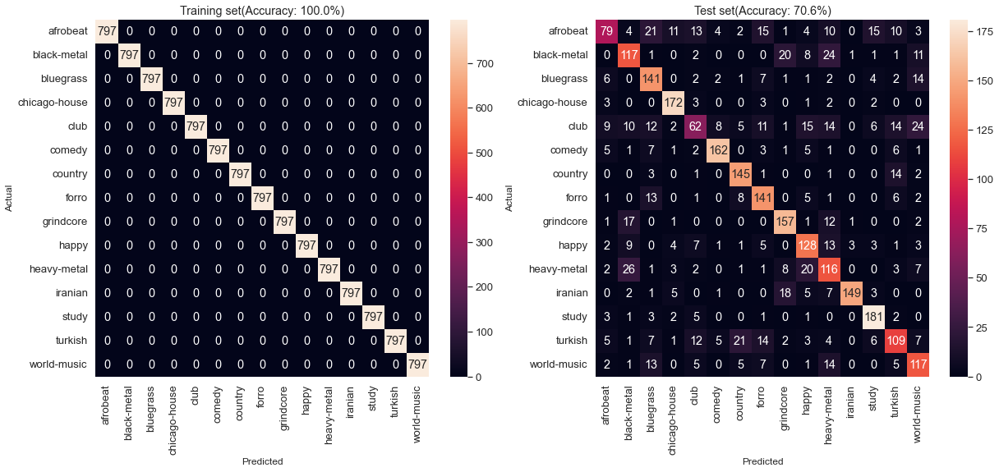

In [200]:
#Confusion matrix for knn model

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,8))

#training set
Y_train_pred_knn=final_knn.predict(X_train_smote)
train_accuracy=accuracy_score(Y_train_smote, Y_train_pred_knn)
sns.heatmap(confusion_matrix(Y_train_smote,Y_train_pred_knn), annot=True,fmt='d', yticklabels=enc_gen,xticklabels=enc_gen,ax=ax1)
ax1.set_title(f'Training set(Accuracy: {round(train_accuracy*100,2)}%)')
ax1.set_xlabel('Predicted',fontsize=12)
ax1.set_ylabel('Actual',fontsize=12);

#test set
Y_test_pred_knn=final_knn.predict(X_test)
test_accuracy=accuracy_score(Y_test,Y_test_pred_knn)
sns.heatmap(confusion_matrix(Y_test,Y_test_pred_knn), annot=True,fmt='d',yticklabels=enc_gen,xticklabels=enc_gen,ax=ax2)
ax2.set_title(f'Test set(Accuracy: {round(test_accuracy*100,2)}%)')
ax2.set_xlabel('Predicted',fontsize=12)
ax2.set_ylabel('Actual',fontsize=12);

plt.savefig('training set_knn.png', bbox_inches='tight')
plt.savefig('test set_knn.png', bbox_inches='tight')

For optimized tuned KNN Model:

Accuracy on training set is 100 % and on test set is 70.6%

# Classification Report

In [201]:
Y_true, Y_pred = Y_test, final_knn.predict(X_test)
print('Classification report on final tuned test set:\n %s' %classification_report(Y_true, Y_pred))
print()

Classification report on final tuned test set:
               precision    recall  f1-score   support

           0       0.67      0.41      0.51       192
           1       0.62      0.63      0.62       186
           2       0.63      0.77      0.69       183
           3       0.85      0.92      0.89       186
           4       0.53      0.32      0.40       193
           5       0.89      0.83      0.86       195
           6       0.77      0.87      0.81       167
           7       0.67      0.79      0.73       178
           8       0.75      0.82      0.78       192
           9       0.65      0.71      0.68       180
          10       0.52      0.61      0.56       190
          11       0.97      0.78      0.86       191
          12       0.82      0.91      0.86       199
          13       0.63      0.55      0.59       197
          14       0.61      0.69      0.64       170

    accuracy                           0.71      2799
   macro avg       0.70      0.7

## Final Accuracy: 
## For K-Nearest Neighbor Model 
## Accuracy on training set is 100% and on test set is 70.6%

# 3. Decision Tree Model

no scaling and oversampling are required for Decision Tree,Random Forest and Gradient Boosting models

## Building and evaluating the tree

In [272]:
from sklearn.tree import DecisionTreeClassifier

In [273]:
tree_clf = DecisionTreeClassifier(random_state= 42) 
tree_clf.fit(X_train, Y_train)

DecisionTreeClassifier(random_state=42)

In [274]:
print('depth of tree: ',tree_clf.tree_.max_depth)

depth of tree:  30


# Confusion matrix and accuracy score of initial decision tree

Accuracy (train):  1.0
Accuracy (test):  0.6702393712040015


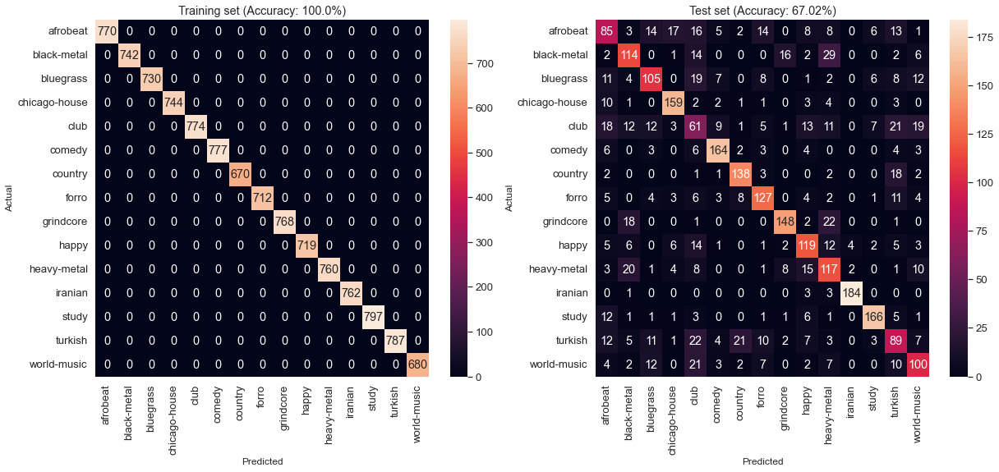

In [275]:
#confusion matrix for initial knn model 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))

# Training Set
Y_train_pred = tree_clf.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_train_pred)
print('Accuracy (train): ',train_accuracy)
sns.heatmap(confusion_matrix(Y_train, Y_train_pred), annot=True, fmt="d", yticklabels=enc_gen, xticklabels=enc_gen, ax=ax1)
ax1.set_title(f'Training set (Accuracy: {round(train_accuracy*100, 2)}%)')
ax1.set_xlabel('Predicted', fontsize=12)
ax1.set_ylabel('Actual', fontsize=12);

# Test Set
Y_test_pred = tree_clf.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_test_pred)
print('Accuracy (test): ',test_accuracy)
sns.heatmap(confusion_matrix(Y_test, Y_test_pred), annot=True, fmt="d", yticklabels=enc_gen, xticklabels=enc_gen, ax=ax2)
ax2.set_title(f'Test set (Accuracy: {round(test_accuracy*100, 2)}%)')
ax2.set_xlabel('Predicted', fontsize=12)
ax2.set_ylabel('Actual', fontsize=12);

# Hyperparameter Regularization

## Max depth

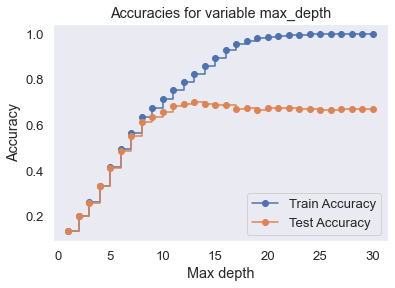

In [276]:
train_acc = []
test_acc = []
max_depths = range(1, tree_clf.tree_.max_depth+1)

for i in max_depths:
    tree_clf = DecisionTreeClassifier(random_state=42, max_depth=i)
    tree_clf.fit(X_train, Y_train)
    #training set
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    #test set
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
# print(train_acc)
# print(test_acc)

plt.plot(max_depths, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(max_depths, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable max_depth')
plt.xlabel('Max depth')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

In [277]:
print(np.where(test_acc==max(test_acc)))

(array([12], dtype=int64),)


In [278]:
test_acc[12]

0.7006073597713469

In [279]:
max_depths[12]

13

Maximum at depth=13

The training accuracy increases with increasing depth of the tree. The test accuracy, on the other hand, peaks at max_depth=13. From this value on, the accuracy on the test set drops slightly again. 
So max_depth=13 can be the optimal hyperparameter to get better accuracy.

# Pruning by variation of ccp_alpha

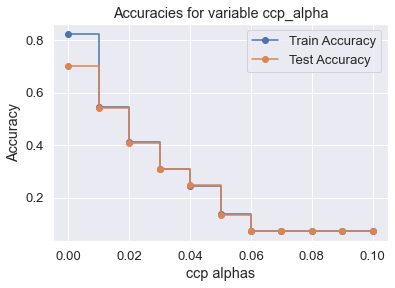

In [289]:
train_acc = []
test_acc = []
ccp_alphas =np.linspace(0,0.1,11)

for i in ccp_alphas:
    tree_clf = DecisionTreeClassifier(random_state=42, ccp_alpha=i, max_depth=13)
    tree_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(ccp_alphas, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(ccp_alphas, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable ccp_alpha')
plt.xlabel('ccp alphas')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.show();

In [290]:
print(np.where(test_acc==max(test_acc)))

(array([0], dtype=int64),)


Maximum at ccp_alpha=0.0 

Pruning will not enhance the performance for fixed depth.

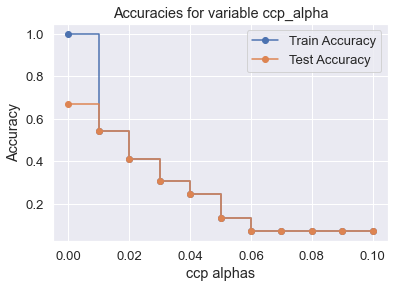

In [291]:
train_acc = []
test_acc = []
ccp_alphas =np.linspace(0,0.1,11)

for i in ccp_alphas:
    tree_clf = DecisionTreeClassifier(random_state=42, ccp_alpha=i)
    tree_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(ccp_alphas, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(ccp_alphas, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable ccp_alpha')
plt.xlabel('ccp alphas')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.show();

In [292]:
print(np.where(test_acc==max(test_acc)))

(array([0], dtype=int64),)


Pruning for unfixed depth also doesn't enhance the performance.

Actual maximum accuracy:

In [293]:
tree_clf = DecisionTreeClassifier(random_state=42, ccp_alpha=0.0, max_depth=13)
tree_clf.fit(X_train, Y_train)
accuracy_score(Y_test, tree_clf.predict(X_test))

0.7006073597713469

# Best vs. random splitting

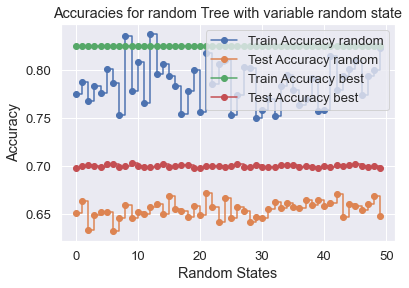

In [294]:
train_acc = []
test_acc = []
random_states =np.arange(50)

for i in random_states:
    tree_clf = DecisionTreeClassifier(random_state=i, ccp_alpha=0, max_depth=13, splitter='random')
    tree_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(random_states, train_acc, marker='o', label='Train Accuracy random', drawstyle='steps-post')
plt.plot(random_states, test_acc, marker='o', label='Test Accuracy random', drawstyle='steps-post')

train_acc = []
test_acc = []
random_states =np.arange(50)

for i in random_states:
    tree_clf = DecisionTreeClassifier(random_state=i, ccp_alpha=0, max_depth=13)
    tree_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(random_states, train_acc, marker='o', label='Train Accuracy best', drawstyle='steps-post')
plt.plot(random_states, test_acc, marker='o', label='Test Accuracy best', drawstyle='steps-post')
plt.title('Accuracies for random Tree with variable random state')
plt.xlabel('Random States')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.show();

In [295]:
tree_clf = DecisionTreeClassifier(random_state=42, ccp_alpha=0.0, max_depth=13, splitter='best', criterion='entropy')
tree_clf.fit(X_train, Y_train)
accuracy_score(Y_test, tree_clf.predict(X_test))

0.6627366916755985

'Best' splitting works best for all random states.

# Gini vs Entropy

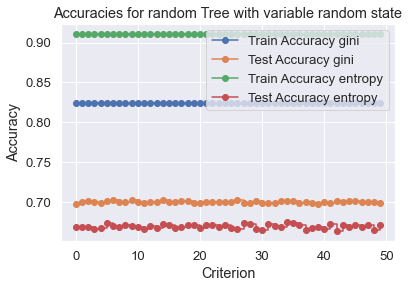

In [296]:
train_acc = []
test_acc = []
random_states =np.arange(50)

for i in random_states:
    tree_clf = DecisionTreeClassifier(random_state=i, ccp_alpha=0, max_depth=13, splitter='best', criterion='gini')
    tree_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(random_states, train_acc, marker='o', label='Train Accuracy gini', drawstyle='steps-post')
plt.plot(random_states, test_acc, marker='o', label='Test Accuracy gini', drawstyle='steps-post')

train_acc = []
test_acc = []
random_states =np.arange(50)

for i in random_states:
    tree_clf = DecisionTreeClassifier(random_state=i, ccp_alpha=0, max_depth=13, splitter='best', criterion='entropy')
    tree_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(random_states, train_acc, marker='o', label='Train Accuracy entropy', drawstyle='steps-post')
plt.plot(random_states, test_acc, marker='o', label='Test Accuracy entropy', drawstyle='steps-post')
plt.title('Accuracies for random Tree with variable random state')
plt.xlabel('Criterion')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.show();

No big difference, but entropy performs better on training set.
'Gini' will be used on optimized model for better test accuracy.

# Minimum number of samples per split

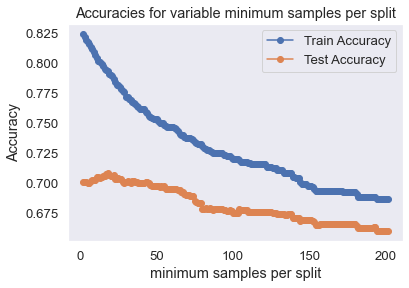

In [298]:
train_acc = []
test_acc = []
min_samp_split = np.arange(200)+2

for i in min_samp_split:
    tree_clf = DecisionTreeClassifier(random_state=42, ccp_alpha=0.0, max_depth=13, min_samples_split=i)
    tree_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, tree_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, tree_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(min_samp_split, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(min_samp_split, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable minimum samples per split')
plt.xlabel('minimum samples per split')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.grid()

In [299]:
print(np.where(test_acc==max(test_acc)))

(array([16], dtype=int64),)


In [300]:
min_samp_split[16]

18

In [301]:
test_acc[16]

0.7081100392997499

The biggest accuracy occurs at minimum samples of 18 per split.

# Optimized Decision Tree Model

In [302]:
tree_final = DecisionTreeClassifier(random_state=42, 
                                    ccp_alpha=0.0, 
                                    max_depth=13, 
                                    splitter='best', 
                                    criterion='gini', 
                                    min_samples_split=18)
tree_final.fit(X_train, Y_train)
tree_acc=accuracy_score(Y_test, tree_final.predict(X_test))
print('Accuracy (test): ',tree_acc)

Accuracy (test):  0.7081100392997499


## Conclusion: 
Decision Tree Classifier for now works best in our case with the following properties:

#### ccp_alpha = 0.0 (no pruning)

#### max_depth = 13

#### splitter = 'best'

#### criterion = 'gini'

#### min_samples_split=18


# Confusion matrix with hyperparameter tuning

Accuracy (train):  0.793155825589707
Accuracy (test):  0.7081100392997499


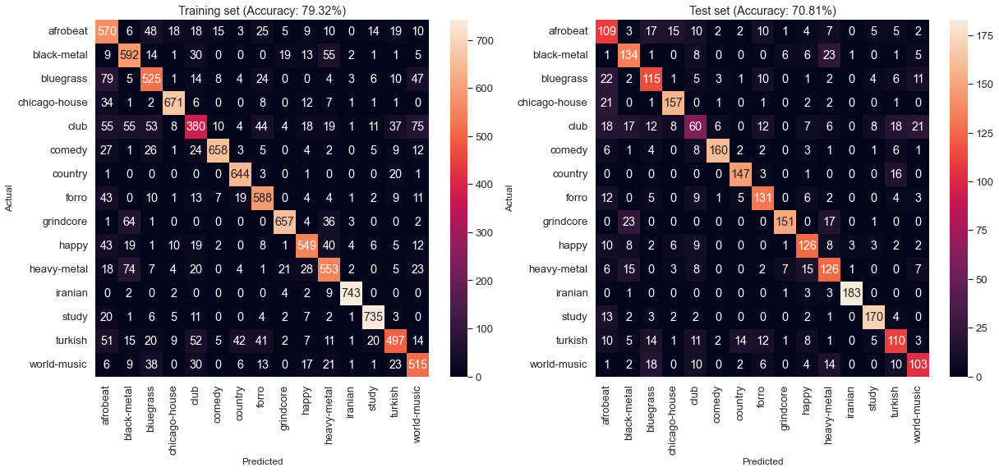

In [303]:
#confusion matrix for decision tree
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))

# Training Set
Y_train_pred_tree = tree_final.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_train_pred_tree)
print('Accuracy (train): ',train_accuracy)
sns.heatmap(confusion_matrix(Y_train, Y_train_pred_tree), annot=True, fmt="d", yticklabels=enc_gen, xticklabels=enc_gen, ax=ax1)
ax1.set_title(f'Training set (Accuracy: {round(train_accuracy*100, 2)}%)')
ax1.set_xlabel('Predicted', fontsize=12)
ax1.set_ylabel('Actual', fontsize=12);

# Test Set
Y_test_pred_tree = tree_final.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_test_pred_tree)
print('Accuracy (test): ',test_accuracy)
sns.heatmap(confusion_matrix(Y_test, Y_test_pred_tree), annot=True, fmt="d", yticklabels=enc_gen, xticklabels=enc_gen, ax=ax2)
ax2.set_title(f'Test set (Accuracy: {round(test_accuracy*100, 2)}%)')
ax2.set_xlabel('Predicted', fontsize=12)
ax2.set_ylabel('Actual', fontsize=12);
plt.savefig('training set_tree.png', bbox_inches='tight')
plt.savefig('test set_tree.png', bbox_inches='tight')

## For tuned Decision Tree Model:

## Accuracy on training set is 79.32 % and on test set is 70.81%

# Searching for the best parameters via GridSearch


In [304]:
tree_clf = DecisionTreeClassifier()
tree_clf.fit(X_train, Y_train)

min_samp_split = np.arange(80)+2
ccp_alphas =np.linspace(0,0.04,4)
max_depths = range(1,30+1)

params_grid = {'ccp_alpha': ccp_alphas,
          'min_samples_split': min_samp_split,
          'max_depth': max_depths
          }
grid_search = GridSearchCV(tree_clf, params_grid, cv=KFold(3, random_state=42, shuffle=True), n_jobs=-1, scoring='accuracy')

In [305]:
start_time = time.time()
grid_search.fit(X_train, Y_train)
comp_time_gs = time.time() - start_time
print("--- Computation time for grid search: %s seconds ---" % comp_time_gs)

--- Computation time for grid search: 271.24490189552307 seconds ---


## Best tree according to GridSearch

In [306]:
print('Best Score: %s' % grid_search.best_score_)
print('Best Hyperparameters: %s' % grid_search.best_params_)

Best Score: 0.6807526438991816
Best Hyperparameters: {'ccp_alpha': 0.0, 'max_depth': 13, 'min_samples_split': 33}


Without max_features:
If we provide a value of max_features, accuracy decreases.
Thus, if this value is not set, the decision tree will consider all features available to make the best split

### Result from GridSearch:

According to the GridSearch for ccp_alpha from 0 to 0.04 in 4 steps , max_depth upto 30 and min_sample_split upto 81, we get the best setting with:

#### max_depth = 13

#### min_samples_split = 32

#### ccp_alpha = 0

## Optimized Decision Tree according to Grid-Search

In [307]:
tree_final_grid = DecisionTreeClassifier(random_state=42, 
                                    ccp_alpha=0.0, 
                                    max_depth=13, 
                                    splitter='best', 
                                    criterion='gini', 
                                    min_samples_split=33)
tree_final_grid.fit(X_train, Y_train)
tree_acc=accuracy_score(Y_test, tree_final_grid.predict(X_test))
print('Accuracy (test): ',tree_acc)

Accuracy (test):  0.7002500893176135


# Confusion Matrix with hyperparameter tuning via Grid-Search

Accuracy (train):  0.7692101501072195
Accuracy (test):  0.7002500893176135


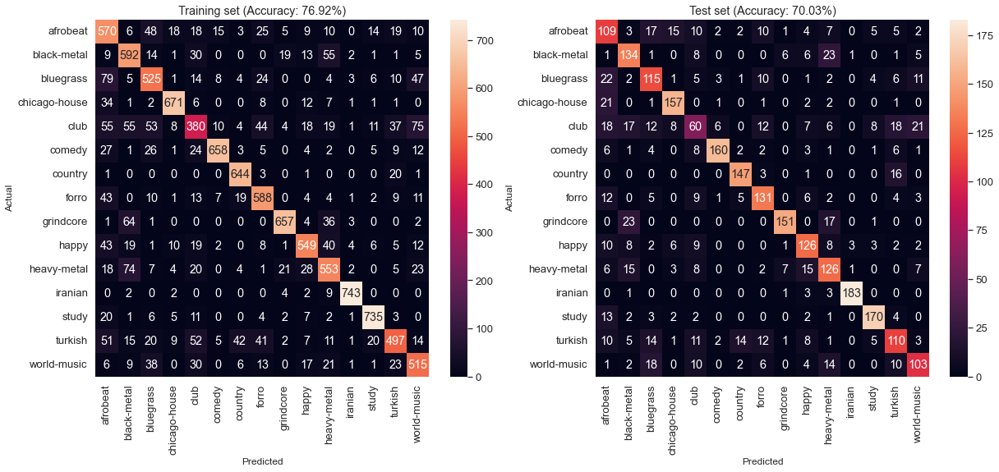

In [308]:
#confusion matrix for decision tree
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))

# Training Set
Y_train_pred_tree_grid = tree_final_grid.predict(X_train)
train_accuracy = accuracy_score(Y_train, Y_train_pred_tree_grid)
print('Accuracy (train): ',train_accuracy)
sns.heatmap(confusion_matrix(Y_train, Y_train_pred_tree), annot=True, fmt="d", yticklabels=enc_gen, xticklabels=enc_gen, ax=ax1)
ax1.set_title(f'Training set (Accuracy: {round(train_accuracy*100, 2)}%)')
ax1.set_xlabel('Predicted', fontsize=12)
ax1.set_ylabel('Actual', fontsize=12);

# Test Set
Y_test_pred_tree_grid = tree_final_grid.predict(X_test)
test_accuracy = accuracy_score(Y_test, Y_test_pred_tree_grid)
print('Accuracy (test): ',test_accuracy)
sns.heatmap(confusion_matrix(Y_test, Y_test_pred_tree), annot=True, fmt="d", yticklabels=enc_gen, xticklabels=enc_gen, ax=ax2)
ax2.set_title(f'Test set (Accuracy: {round(test_accuracy*100, 2)}%)')
ax2.set_xlabel('Predicted', fontsize=12)
ax2.set_ylabel('Actual', fontsize=12);
_inches='tight')

## Accuracy decreases for both sets for using Grid-Search optimization.

It is visible that individual hyperparameter optimization gives better accuracy both in training and test set than Grid-Search Optimization. So we will take individual hyperparameter optimization outputs.

# Classification Report

In [309]:
Y_true, Y_pred = Y_test, tree_final.predict(X_test)
print('Classification report on final tuned test set:\n %s' %classification_report(Y_true, Y_pred))
print()

Classification report on final tuned test set:
               precision    recall  f1-score   support

           0       0.48      0.57      0.52       192
           1       0.63      0.72      0.67       186
           2       0.60      0.63      0.61       183
           3       0.81      0.84      0.83       186
           4       0.43      0.31      0.36       193
           5       0.91      0.82      0.86       195
           6       0.85      0.88      0.86       167
           7       0.69      0.74      0.71       178
           8       0.90      0.79      0.84       192
           9       0.67      0.70      0.68       180
          10       0.59      0.66      0.63       190
          11       0.97      0.96      0.97       191
          12       0.86      0.85      0.86       199
          13       0.60      0.56      0.58       197
          14       0.65      0.61      0.63       170

    accuracy                           0.71      2799
   macro avg       0.71      0.7

In [340]:
best_tree = grid_search.best_estimator_
best_tree.fit(X_train, Y_train)
print(accuracy_score(Y_test, best_tree.predict(X_test)))

0.7009646302250804


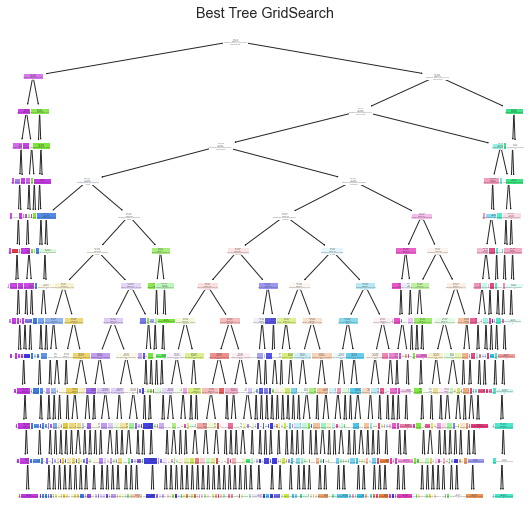

In [342]:
from sklearn import tree

fig = plt.figure(figsize=(9,9))
tree.plot_tree(best_tree, filled =True)
plt.title('Best Tree GridSearch')
plt.show();

The attempt of this Decision Tree pipeline gave us some breif insights into the Decision Tree workflow.

Trying to find the best parameters by hand is not as efficient as trying out every possible constellation and finding the best list of parameters, because for example, if we find the best value for parameter=a, we can try to find the best value for parameter=b, but as we find the best value for b the best value for a shifts, and so on.

The confusion matrices always show the same structure. Some genres are easier some are more difficult to predict. This may be because of some similarities between those genres. Even though the decision tree classifier is considered to be a white box model, the overall depth of the trees leads to a high complexity, which is not easy to evaluate for the humans eye.

## Final Accuracy: 
## For Decision Tree Model 
## Accuracy on training set is 79.32% and on test set is 70.81% 

# 4. Random Forest Model

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import time

Ensemble Learning:Random Forest Classifier

# Training Random Forest model and evaluating on test dataset initially

In [344]:
rfc = RandomForestClassifier()
rfc.fit(X_train, Y_train)
rfc.score(X_train,Y_train)
print(f'Accuracy(train) = {rfc.score(X_train,Y_train)}')

Accuracy(train) = 1.0


Accuracy = Number of correct predictions/Total number of predictions.

On training dataset, accuracy is 100% as expected for overfitting.
To eliminate this overfitting, we have to use cross validation with hyper parameter tuning.

In [345]:
rfc = RandomForestClassifier()
rfc.fit(X_train, Y_train)
print(f'Accuracy(test) = {rfc.score(X_test,Y_test)}')

Accuracy(test) = 0.795998570918185


On test dataset, accuracy is 79.59 %.

# Cross-validation without hyperparameter tuning

In [346]:
cv=StratifiedKFold(10,shuffle=True, random_state=42)
rfc_clf=RandomForestClassifier(random_state=42)
rfc_clf.fit(X_train, Y_train)
accuracy=cross_val_score(rfc_clf,X_train,Y_train, scoring='accuracy', cv=cv, n_jobs=-1)
print("Accuracy of Model with Cross Validation is:",accuracy.mean() * 100)

Accuracy of Model with Cross Validation is: 78.77952253287374


# Confusion matrix of initial Random Forest model

Accuracy (train):  1.0
Accuracy (test):  0.7945694891032512


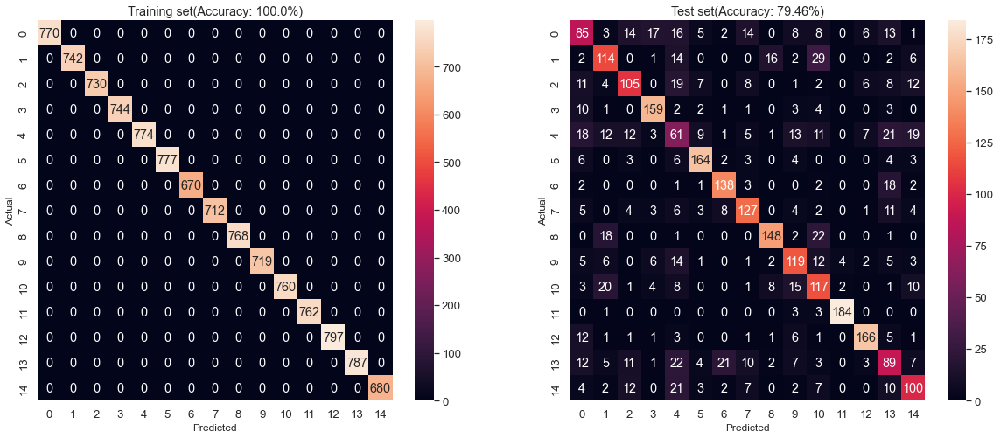

In [347]:
#Confusion matrix for initial Random Forest Model

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,8))

#training set
Y_train_pred_rfc=rfc_clf.predict(X_train)
train_accuracy=accuracy_score(Y_train, Y_train_pred_rfc)
print('Accuracy (train): ',train_accuracy)
sns.heatmap(confusion_matrix(Y_train,Y_train_pred), annot=True,fmt='d', yticklabels='auto',xticklabels='auto',ax=ax1)
ax1.set_title(f'Training set(Accuracy: {round(train_accuracy*100,2)}%)')
ax1.set_xlabel('Predicted',fontsize=12)
ax1.set_ylabel('Actual',fontsize=12);

#test set
Y_test_pred_rfc=rfc_clf.predict(X_test)
test_accuracy=accuracy_score(Y_test,Y_test_pred_rfc)
print('Accuracy (test): ',test_accuracy)
sns.heatmap(confusion_matrix(Y_test,Y_test_pred), annot=True,fmt='d',yticklabels='auto',xticklabels='auto',ax=ax2)
ax2.set_title(f'Test set(Accuracy: {round(test_accuracy*100,2)}%)')
ax2.set_xlabel('Predicted',fontsize=12)
ax2.set_ylabel('Actual',fontsize=12);

 As it is observed initially training set accuracy is about 100% 
and test set accuracy is found to be of 79.46 %

Hyperparameter tuning is about optimizing the performance of the model. Here, first it will be examined the influence of individual hyperparameters on the accuracy. Then an automatic search over the total parameter will be spaced to find the optimal result. For the performance evaluation, cross validation will be again used with StratifiedKFold.

The influence of different hyperparameters is to be tested. At the beginning of the cell, the values for each hyperparameter are given. A for-loop will be used to iterate through the list of values and will create a random forest with each parameter. Then a cross-validation with 10 folds for each ensemble will be evaluated. The scores will be appended to the variable cv_scores. Then we can use the plot_validations function to visualize the results.

# Individual hyperparameter influence

In [348]:
def test_model (p_name, p_values):
    cv_scores=[]
    cv=StratifiedKFold(10,shuffle=True, random_state=42)
    for p in p_values:
        rfc=RandomForestClassifier(random_state=42)
        rfc.set_params(**{p_name:p})
        scores=cross_val_score(rfc,X_train,Y_train, scoring='accuracy', cv=cv, n_jobs=-1)
        cv_scores.append(scores)
    return cv_scores

In [349]:
def plot_validations(cv_scores, x_label, x_ticklabels):
    plt.figure(figsize=(len(x_ticklabels),4))
    ax = sns.boxplot(data=cv_scores)
    ax.set_xticklabels(x_ticklabels)
    ax.set_ylabel('accuracy')
    ax.set_xlabel(x_label);

# Hyperparameter Regularization

## n_estimators

Accuracy score (training): 1.000
Accuracy score (test): 0.803



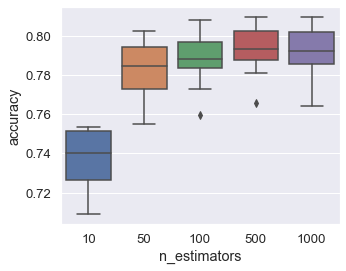

In [350]:
n_trees = [10,50,100,500, 1000]
cv_scores = []
for n_estimators in n_trees:
    rfc_clf=RandomForestClassifier(n_estimators=n_estimators, random_state=42)
    rfc_clf.fit(X_train, Y_train)
    
cv_scores=test_model('n_estimators', n_trees)
plot_validations(cv_scores, 'n_estimators', n_trees)

print("Accuracy score (training): {0:.3f}".format(rfc_clf.score(X_train, Y_train)))
print("Accuracy score (test): {0:.3f}\n".format(rfc_clf.score(X_test, Y_test)))

## Influence of the number of trees

Accuracy score (training): [0.99258399 1.         1.         1.         1.        ]
Accuracy score (test): [0.75562701 0.78849589 0.79456949 0.80207217 0.80278671]


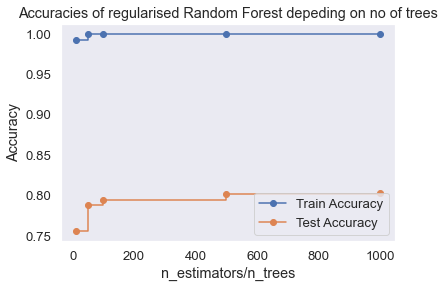

In [351]:
train_acc = []
test_acc = []
n_trees = [10,50,100,500, 1000]


for n_estimators in n_trees:
    rfc_clf = RandomForestClassifier(random_state=42, n_estimators=n_estimators)
    rfc_clf.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, rfc_clf.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, rfc_clf.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
print("Accuracy score (training):",train_acc)
print("Accuracy score (test):",test_acc)

# Plotting accuracies vs. no. of trees
plt.plot(n_trees, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(n_trees, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies of regularised Random Forest depeding on no of trees')
plt.xlabel('n_estimators/n_trees')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

The training accuracy mostly stays same with increasing trees of the random forest. The test accuracy, goes upto for n_estimators or n_trees=1000. So,n_estimators=1000 can be the optimal hyperparameter to get better accuracy.

## max_depth

Accuracy score (training): 0.997
Accuracy score (test): 0.800



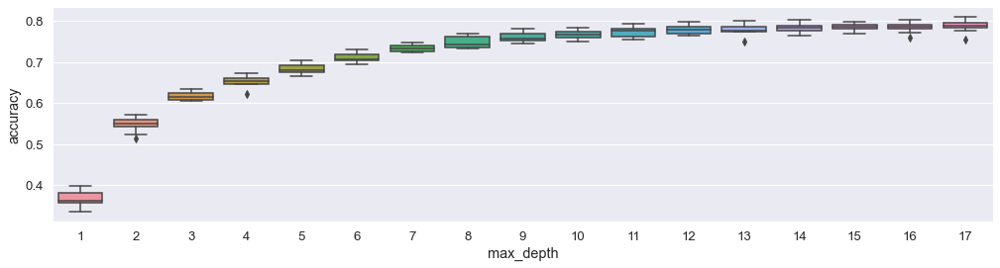

In [352]:
max_depths = range(1,18)
cv_scores = []
for depth in max_depths:
        rfc_clf=RandomForestClassifier( max_depth=depth, random_state=42)
        rfc_clf.fit(X_train, Y_train)

cv_scores=test_model('max_depth', max_depths)
plot_validations(cv_scores, 'max_depth', max_depths)
print("Accuracy score (training): {0:.3f}".format(rfc_clf.score(X_train, Y_train)))
print("Accuracy score (test): {0:.3f}\n".format(rfc_clf.score(X_test, Y_test)))

## The influence of the maximum depth:

Accuracy score (training): [0.39608649 0.54458542 0.6258935  0.66449249 0.69576483 0.73320229
 0.76617227 0.79735525 0.8275554  0.85963188 0.88849178 0.91967477
 0.94951751 0.9709614  0.98436383 0.99338813 0.99705147]
Accuracy score (test): [0.39514112 0.53912111 0.6227224  0.66273669 0.69203287 0.72418721
 0.73561986 0.76670239 0.7738478  0.78063594 0.78385138 0.79242587
 0.79135406 0.78921043 0.79814219 0.79314041 0.79992855]


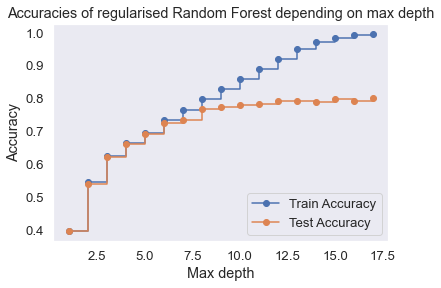

In [353]:
train_acc = []
test_acc = []
max_depths = range(1,18)


for i in max_depths:
    rfc_clf = RandomForestClassifier(random_state=42, max_depth=i)
    rfc_clf.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, rfc_clf.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, rfc_clf.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
print("Accuracy score (training):",train_acc)
print("Accuracy score (test):",test_acc)

plt.plot(max_depths, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(max_depths, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies of regularised Random Forest depending on max depth')
plt.xlabel('Max depth')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

In [354]:
print(np.where(test_acc==max(test_acc)))

(array([16], dtype=int64),)


In [355]:
test_acc[16]

0.7999285459092533

In [356]:
max_depths[16]

17

The training accuracy increases with increasing depth of the random forest. The test accuracy, on the other hand, peaks at max_depth=17. From this value on, the accuracy on the test set gets saturated. Thus, max_depth=17 can be the optimal hyperparameter to get better accuracy.

## max_features

Accuracy score (training): 1.000
Accuracy score (test): 0.795



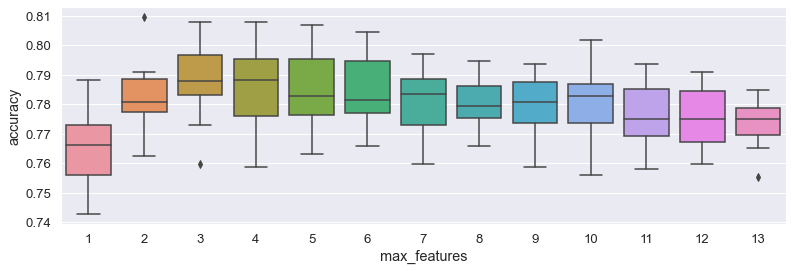

In [357]:
max_features = range(1,X.shape[1])
cv_scores = []
for feature in max_features:
            rfc_clf=RandomForestClassifier( max_features='sqrt', random_state=42)
            rfc_clf.fit(X_train, Y_train)
            
cv_scores=test_model('max_features', max_features)
plot_validations(cv_scores, 'max_features', max_features)
print("Accuracy score (training): {0:.3f}".format(rfc_clf.score(X_train, Y_train)))
print("Accuracy score (test): {0:.3f}\n".format(rfc_clf.score(X_test, Y_test)))

## The influence of the maximum features:

Accuracy score (training): [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Accuracy score (test): [0.78135048 0.80028582 0.79456949 0.79492676 0.79278314 0.79742765
 0.79421222 0.7920686  0.78992497 0.78742408 0.79385495 0.78635227
 0.78099321]


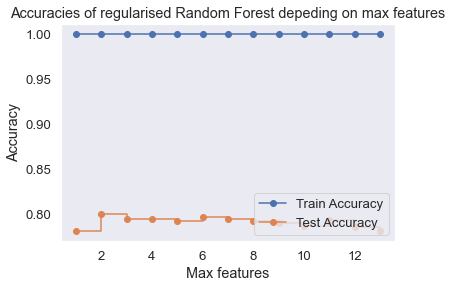

In [358]:
train_acc = []
test_acc = []
max_features = range(1,X.shape[1])

for features in max_features:
    rfc_clf = RandomForestClassifier(max_features = features, random_state=42)
    rfc_clf.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, rfc_clf.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, rfc_clf.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
print("Accuracy score (training):",train_acc)
print("Accuracy score (test):",test_acc)
    

plt.plot(max_features, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(max_features, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies of regularised Random Forest depeding on max features')
plt.xlabel('Max features')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

In [359]:
print(np.where(test_acc==max(test_acc)))

(array([1], dtype=int64),)


In [360]:
test_acc[1]

0.8002858163629868

In [361]:
max_features[1]

2

The training accuracy saturates with 1. The test accuracy, on the other hand, also stays saturated where
max_features=2 which can be the optimal hyperparameter to get better accuracy.

# min_samp_split

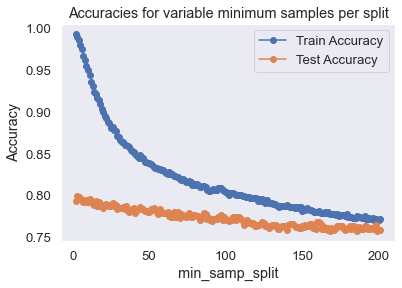

In [362]:
train_acc = []
test_acc = []
min_samp_split = np.arange(200)+2

for i in min_samp_split:
    rfc_clf = RandomForestClassifier(random_state=42, max_depth=17, min_samples_split=i)
    rfc_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, rfc_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, rfc_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(min_samp_split, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(min_samp_split, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable minimum samples per split')
plt.xlabel('min_samp_split')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.grid()

In [363]:
print(np.where(test_acc==max(test_acc)))

(array([1], dtype=int64),)


In [364]:
min_samp_split[1]

3

In [365]:
test_acc[1]

0.7995712754555199

# min_samp_leaf

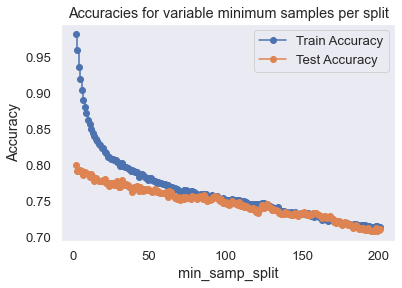

In [366]:
train_acc = []
test_acc = []
min_samples_leaf = np.arange(200)+2

for i in min_samp_split:
    rfc_clf = RandomForestClassifier(random_state=42, max_depth=17, min_samples_leaf=i)
    rfc_clf.fit(X_train, Y_train)
    acc_train = accuracy_score(Y_train, rfc_clf.predict(X_train))
    acc_test = accuracy_score(Y_test, rfc_clf.predict(X_test))
    train_acc = np.append(train_acc, acc_train)
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(min_samp_split, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(min_samp_split, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable minimum samples per split')
plt.xlabel('min_samp_split')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.grid()

In [367]:
print(np.where(test_acc==max(test_acc)))

(array([0], dtype=int64),)


In [368]:
min_samples_leaf[0]

2

In [369]:
test_acc[0]

0.7988567345480528

## Conclusion:

Random Forest Classifier for now works best in our case with the following properties:

#### max_features= 2

#### max_depth = 17

#### n_estimators=1000

#### min_samples_leaf=2

#### min_samples_split=3

## Optimized Random Forest model with individual parameter optimization

In [371]:
rfc_final_ind = RandomForestClassifier(random_state=42,  
                                    max_depth=17, 
                                    max_features=2,  
                                    min_samples_split=3,
                                    n_estimators=1000,
                                    min_samples_leaf=2, 
                                    criterion = 'entropy', 
                                    class_weight='balanced_subsample')
rfc_final_ind.fit(X_train, Y_train)
rfc_acc=accuracy_score(Y_test, rfc_final_ind.predict(X_test))
print('Accuracy (test): ',rfc_acc)

Accuracy (test):  0.7956413004644516


# Fine-Tuning model with Grid-Search

with hyper parameters with the help of GridSearch and RandomSearch

# Grid-Search

With Grid-Search, we can search over specified parameter values for an estimator. With this search, each combination of parameter is tested and evaluated with a cross validation. At the end, we will get the set of hyperparameter with the best performance regarding the given metric.

In [13]:
# loading libraries and data again for interruption

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
import time

In [15]:
df = pd.read_csv('group7_15_final_genre_dataset.csv',index_col=0)

In [16]:
Y=df['genre']
X=df.drop('genre',axis=1)

In [17]:
from sklearn.preprocessing import LabelEncoder
Y_encoded = LabelEncoder().fit_transform(Y)

def encoded_genres():
    l = np.array([])
    for a in range(len(pd.Series(Y_encoded).value_counts())):
        for i in range(len(Y)):
            if Y_encoded[i]==a:
                l = np.append(l, Y[i])
                print(a,' means: ',Y[i])
                break
    return l
enc_gen = encoded_genres()
print(enc_gen)

0  means:  afrobeat
1  means:  black-metal
2  means:  bluegrass
3  means:  chicago-house
4  means:  club
5  means:  comedy
6  means:  country
7  means:  forro
8  means:  grindcore
9  means:  happy
10  means:  heavy-metal
11  means:  iranian
12  means:  study
13  means:  turkish
14  means:  world-music
['afrobeat' 'black-metal' 'bluegrass' 'chicago-house' 'club' 'comedy'
 'country' 'forro' 'grindcore' 'happy' 'heavy-metal' 'iranian' 'study'
 'turkish' 'world-music']


### Splitting Dataset

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_encoded, test_size=0.2, random_state=42, stratify=Y_encoded)
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((11192, 14), (2799, 14), (11192,), (2799,))

In [19]:
rfc=RandomForestClassifier()
rfc.fit(X_train, Y_train)

RandomForestClassifier()

In [30]:
from sklearn import set_config
import time

max_depths = range(1,20+1)

tuned_parameter = { 
          'n_estimators': [10,20,50,500,1000],
          'max_depth': max_depths,
          'max_features': [1,2,3,4,5]
          }

grid_search_rfc = GridSearchCV(rfc, tuned_parameter, cv=KFold(3, random_state=42, shuffle=True), n_jobs=-1, scoring='accuracy')

In [31]:
start_time = time.time()
grid_search_rfc.fit(X_train,Y_train)
print('Best Score: %s' % grid_search_rfc.best_score_)
print('Best Hyperparameters: %s' % grid_search_rfc.best_params_)

# computation of time
comp_time_gs = time.time() - start_time
print("--- Computation time for grid search: %s seconds ---" % comp_time_gs)

Best Score: 0.7869005403367529
Best Hyperparameters: {'max_depth': 18, 'max_features': 3, 'n_estimators': 1000}
--- Computation time for grid search: 405.6185302734375 seconds ---


## Hyperparameters suggested by GridSearch

Random Forest Classifier works best in our case with the following properties:

#### n_estimators=1000

#### max_depth = 18

#### max_features=3

#### criterion = 'entropy' (entropy gives better output)

#### min_samples_split=3 (same as before)

#### min_samples_leaf= 2 (same as before)

if we use min_samples_split and min_samples_leaf with some range in grid-search, computation takes much time.
That's why taking these values from previous individual optimization.

In [32]:
Y_pred = grid_search_rfc.best_estimator_.predict(X_test)
test_accuracy_gs = accuracy_score(Y_test, Y_pred)
print(f'Accuracy (test): {round(test_accuracy_gs, 4)*100}%.')

Accuracy (test): 79.96%.


# RandomSearch

In [33]:
from sklearn.model_selection import RandomizedSearchCV

In [36]:
random_search = RandomizedSearchCV(rfc, tuned_parameter, n_iter=100, cv=KFold(3, random_state=42, shuffle=True), n_jobs=-1, scoring='accuracy', random_state=42)
start_time = time.time()

random_search.fit(X_train,Y_train)

RandomizedSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
                   estimator=RandomForestClassifier(), n_iter=100, n_jobs=-1,
                   param_distributions={'max_depth': range(1, 21),
                                        'max_features': [1, 2, 3, 4, 5],
                                        'n_estimators': [1000]},
                   random_state=42, scoring='accuracy')

In [37]:
print(random_search.best_params_, random_search.best_score_)

# computation time
comp_time_rs = time.time() - start_time
print("--- Computation time for random search: %s seconds ---" % comp_time_rs)

{'n_estimators': 1000, 'max_features': 3, 'max_depth': 19} 0.7872580502607311
--- Computation time for random search: 398.4348063468933 seconds ---


In [38]:
print('Best Score: %s' % random_search.best_score_)
print('Best Hyperparameters: %s' % random_search.best_params_)

Best Score: 0.7872580502607311
Best Hyperparameters: {'n_estimators': 1000, 'max_features': 3, 'max_depth': 19}


In [39]:
predictions_rs = random_search.best_estimator_.predict(X_test)
test_accuracy_rs = accuracy_score(Y_test, predictions_rs)
print(f'Accuracy(test): {round(test_accuracy_rs, 4)*100}%.')

Accuracy(test): 79.67%.


# Comparison GridSearch and RandomSearch

a small comprehension of the grid search with random search regarding computation time and accuracy

In [41]:
print(f'Speed: RandomSearch is {round(comp_time_gs / comp_time_rs, 1)}x faster.')
print(f'Accuracy: GridSearch  is {round((test_accuracy_gs / test_accuracy_rs)-1,4)*100}% more accurate than RandomSearch here.')

Speed: RandomSearch is 1.0x faster.
Accuracy: GridSearch  is 0.36% more accurate than RandomSearch here.


## Optimized Random Forest with GridSearch

In [42]:
rfc_final_grid = RandomForestClassifier(random_state=42,  
                                    max_depth=19, 
                                    max_features=3,  
                                    min_samples_split=3,
                                    n_estimators=1000,
                                    min_samples_leaf=2, 
                                    criterion = 'entropy', 
                                    class_weight='balanced_subsample')
rfc_final_grid.fit(X_train, Y_train)
rfc_acc_grid=accuracy_score(Y_test, rfc_final_grid.predict(X_test))
print('Accuracy (test): ',rfc_acc_grid)

Accuracy (test):  0.796713111825652


### Individual Hyperparameter Optimization gives accuracy(test): 79.56%
### GridSearch Hyperparameter Optimization gives accuracy(test): 79.67%

# Classification Report

In [44]:
Y_true, Y_pred = Y_test, rfc_final_grid.predict(X_test)

print('Classification report on final tuned test set:\n %s' %classification_report(Y_true, Y_pred))
print()

Classification report on final tuned test set:
               precision    recall  f1-score   support

           0       0.69      0.66      0.67       192
           1       0.71      0.78      0.75       186
           2       0.74      0.82      0.78       183
           3       0.90      0.92      0.91       186
           4       0.61      0.47      0.53       193
           5       0.93      0.87      0.90       195
           6       0.87      0.93      0.90       167
           7       0.80      0.86      0.83       178
           8       0.92      0.80      0.86       192
           9       0.75      0.79      0.77       180
          10       0.69      0.76      0.72       190
          11       0.96      0.96      0.96       191
          12       0.90      0.97      0.93       199
          13       0.70      0.64      0.67       197
          14       0.77      0.75      0.76       170

    accuracy                           0.80      2799
   macro avg       0.80      0.8

#### Final Optimized Random Forest Model's parameters are from GridSearch optimization

# Confusion matrix for Optimized Random Forest model

Accuracy (train):  0.994639027877055
Accuracy (test):  0.796713111825652


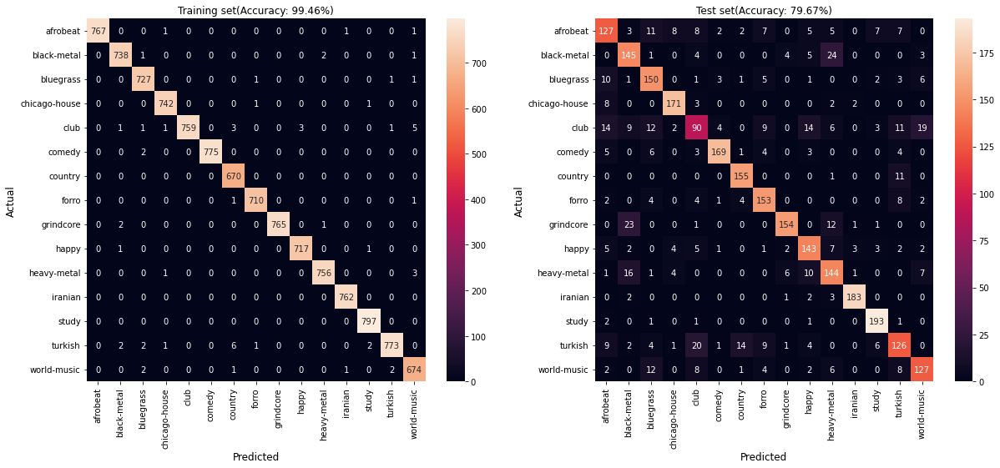

In [46]:
#Confusion matrix for Optimized Random Forest model

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,8))

#training set
Y_train_pred_random=rfc_final_grid.predict(X_train)
train_accuracy=accuracy_score(Y_train, Y_train_pred_random)
print('Accuracy (train): ',train_accuracy)
sns.heatmap(confusion_matrix(Y_train,Y_train_pred_random), annot=True,fmt='d', yticklabels=enc_gen,xticklabels=enc_gen,ax=ax1)
ax1.set_title(f'Training set(Accuracy: {round(train_accuracy*100,2)}%)')
ax1.set_xlabel('Predicted',fontsize=12)
ax1.set_ylabel('Actual',fontsize=12);

#test set
Y_test_pred_random=rfc_final_grid.predict(X_test)
test_accuracy=accuracy_score(Y_test,Y_test_pred_random)
print('Accuracy (test): ',test_accuracy)
sns.heatmap(confusion_matrix(Y_test,Y_test_pred_random), annot=True,fmt='d',yticklabels=enc_gen,xticklabels=enc_gen,ax=ax2)
ax2.set_title(f'Test set(Accuracy: {round(test_accuracy*100,2)}%)')
ax2.set_xlabel('Predicted',fontsize=12)
ax2.set_ylabel('Actual',fontsize=12);

plt.savefig('training set_forest.png', bbox_inches='tight')
plt.savefig('test set_forest.png', bbox_inches='tight')

# Final Accuracy: 
# For Random Forest Model 
# Accuracy on training set is 99.46% and on test set is 79.67% 

### Main Hyperparameter Description

#### 1. n_estimators: 
The n_estimators parameter specifies the number of trees in the forest of the model. The default value for this parameter is 10, which means that 10 different decision trees will be constructed in the random forest.
#### 2. max_depth: 
The max_depth parameter specifies the maximum depth of each tree. The default value for max_depth is None, which means that each tree will expand until every leaf is pure. A pure leaf is one where all of the data on the leaf comes from the same class.

#### 3. min_samples_split: 
The min_samples_split parameter specifies the minimum number of samples required to split an internal leaf node. The default value for this parameter is 2, which means that an internal node must have at least two samples before it can be split to have a more specific classification.

#### 4. min_samples_leaf: 
The min_samples_leaf parameter specifies the minimum number of samples required to be at a leaf node. The default value for this parameter is 1, which means that every leaf must have at least 1 sample that it classifies.

#### 5. max_features:
These are the maximum number of features Random Forest is allowed to try in individual tree. There are multiple options available in Python to assign maximum features

# 5. Gradient Bossting Classifier

In [50]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold

# Training and evaluating Gradient Bossting model

In [51]:
gb = GradientBoostingClassifier()
gb_model=gb.fit(X_train, Y_train)
gb_acc=gb.score(X_test,Y_test)
print(f'Accuracy(test) = {gb_acc}')

Accuracy(test) = 0.7867095391211146


 Accuracy is 78.67% on test set without hyperparameter tuning

# Better evaluation using Cross-Validation

In [52]:
cv=StratifiedKFold(10,shuffle=True,random_state=42)
gb_clf=GradientBoostingClassifier(random_state=42)
gb_clf.fit(X_train, Y_train)
accuracy=cross_val_score(gb_clf,X_train,Y_train, scoring='accuracy', cv=cv, n_jobs=-1)
print("Accuracy of Model with Cross Validation is:",accuracy.mean() * 100)

Accuracy of Model with Cross Validation is: 77.50188305885356


# Confusion matrix initially without hyperparameter tuning

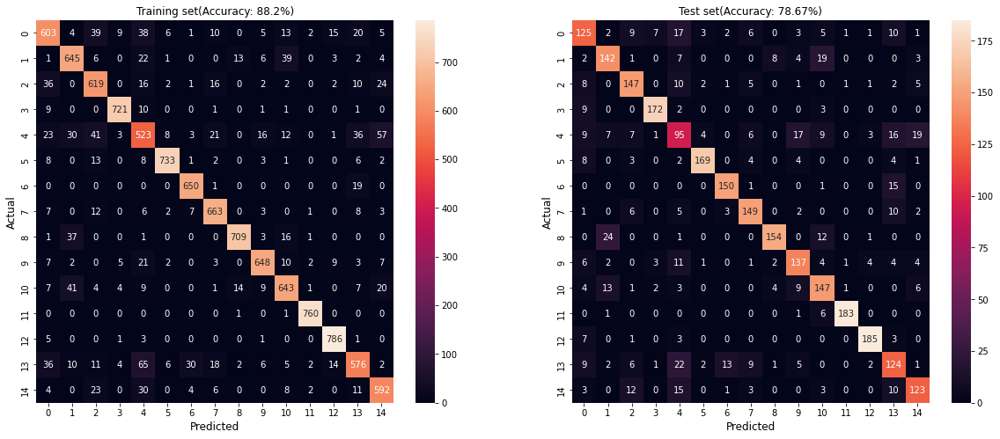

In [53]:
#Confusion matrix for Gradient Boosting Classifier

gb=GradientBoostingClassifier()
gb.fit(X_train,Y_train)

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,8))

#training set
Y_train_pred=gb.predict(X_train)
train_accuracy=accuracy_score(Y_train, Y_train_pred)
sns.heatmap(confusion_matrix(Y_train,Y_train_pred), annot=True,fmt='d', yticklabels='auto',xticklabels='auto',ax=ax1)
ax1.set_title(f'Training set(Accuracy: {round(train_accuracy*100,2)}%)')
ax1.set_xlabel('Predicted',fontsize=12)
ax1.set_ylabel('Actual',fontsize=12);

#test set
Y_test_pred=gb.predict(X_test)
test_accuracy=accuracy_score(Y_test,Y_test_pred)
sns.heatmap(confusion_matrix(Y_test,Y_test_pred), annot=True,fmt='d',yticklabels='auto',xticklabels='auto',ax=ax2)
ax2.set_title(f'Test set(Accuracy: {round(test_accuracy*100,2)}%)')
ax2.set_xlabel('Predicted',fontsize=12)
ax2.set_ylabel('Actual',fontsize=12);

As it is observed initial training set accuracy is about 88.20% and initial test set accuracy is found to be of 78.67%

 # Individual hyperparameter influence

In [54]:
def test_model (p_name, p_values):
    cv_scores=[]
    cv=StratifiedKFold(10,shuffle=True)
    for p in p_values:
        gb=GradientBoostingClassifier()
        gb.set_params(**{p_name:p})
        scores=cross_val_score(gb,X_train,Y_train, scoring='accuracy', cv=cv, n_jobs=-1)
        cv_scores.append(scores)
    return cv_scores

In [55]:
def plot_validations(cv_scores, x_label, x_ticklabels):
    plt.figure(figsize=(len(x_ticklabels),4))
    ax = sns.boxplot(data=cv_scores)
    ax.set_xticklabels(x_ticklabels)
    ax.set_ylabel('accuracy')
    ax.set_xlabel(x_label);

# Hyperparameter Regularization

### n_estimators

Accuracy score (training): 0.998
Accuracy score (test): 0.781



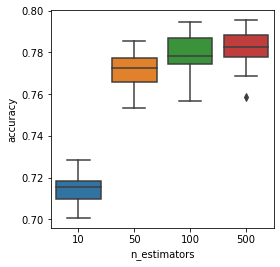

In [56]:
n = [10,50,100,500]
cv_scores = []
for n_estimators in n:
    gbc=GradientBoostingClassifier(n_estimators=n_estimators, learning_rate=0.1, random_state=42)
    gbc.fit(X_train, Y_train)
    
cv_scores=test_model('n_estimators', n)
plot_validations(cv_scores, 'n_estimators', n)

print("Accuracy score (training): {0:.3f}".format(gbc.score(X_train, Y_train)))
print("Accuracy score (test): {0:.3f}\n".format(gbc.score(X_test, Y_test)))

Accuracy score (training): [0.74562187 0.82925304 0.88196926 0.99812366]
Accuracy score (test): [0.7231154  0.77491961 0.78706681 0.78099321]


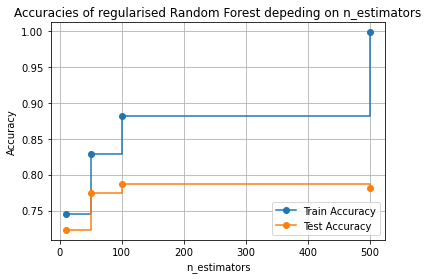

In [57]:
train_acc = []
test_acc = []
n = [10,50,100,500]

for n_estimators in n:

    gbc = GradientBoostingClassifier(n_estimators=n_estimators, learning_rate=0.1, random_state=42)
    gbc.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, gbc.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, gbc.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
print("Accuracy score (training):",train_acc)
print("Accuracy score (test):",test_acc)

plt.plot(n, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(n, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies of regularised Random Forest depeding on n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

In [58]:
print(np.where(test_acc==max(test_acc)))

(array([2], dtype=int64),)


In [59]:
n[2]

100

In [60]:
test_acc[2]

0.7870668095748482

Maximum n_estimators=100

# max_depth

Accuracy score (training): [0.76456397 0.81933524 0.88196926 0.94871337 0.99195854 1.
 1.         1.         1.        ]
Accuracy score (test): [0.74740979 0.78027867 0.78706681 0.78313683 0.77956413 0.78170775
 0.78206502 0.78242229 0.78277956]


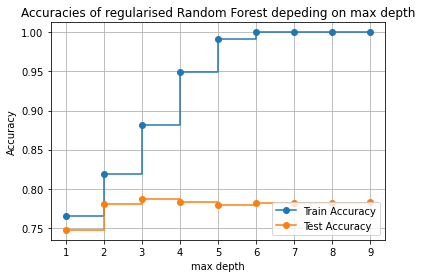

In [62]:
train_acc = []
test_acc = []
max_depths = range(1,10)

for depth in max_depths:

    gbc = GradientBoostingClassifier(max_depth=depth, learning_rate=0.1, random_state=42)
    gbc.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, gbc.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, gbc.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
print("Accuracy score (training):",train_acc)
print("Accuracy score (test):",test_acc)

plt.plot(max_depths, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(max_depths, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies of regularised Random Forest depeding on max depth')
plt.xlabel('max depth')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

In [63]:
print(np.where(test_acc==max(test_acc)))

(array([2], dtype=int64),)


In [64]:
max_depths[2]

3

In [65]:
test_acc[2]

0.7870668095748482

Best value of max_depth=3

# max_features

Accuracy score (training): [0.83211222 0.85614725 0.86320586 0.86776269 0.87205147 0.87455325
 0.87634024 0.87785919 0.87625089 0.87794853 0.88053967 0.87928878
 0.87955683]
Accuracy score (test): [0.78313683 0.78849589 0.79635584 0.78813862 0.78563773 0.78456592
 0.78456592 0.78313683 0.78456592 0.79099678 0.78349411 0.78313683
 0.78670954]


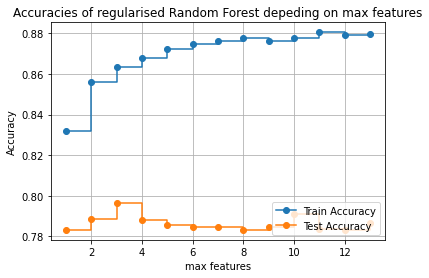

In [66]:
train_acc = []
test_acc = []
max_features = range(1,X.shape[1])

for features in max_features:
    gbc = GradientBoostingClassifier(max_features = features, learning_rate=0.1, random_state=42)
    gbc.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, gbc.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, gbc.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
print("Accuracy score (training):",train_acc)
print("Accuracy score (test):",test_acc)

plt.plot(max_features, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(max_features, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies of regularised Random Forest depeding on max features')
plt.xlabel('max features')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

In [67]:
print(np.where(test_acc==max(test_acc)))

(array([2], dtype=int64),)


In [68]:
max_features[2]

3

In [69]:
test_acc[2]

0.7963558413719185

Maximum features=3

# minimum samples per split

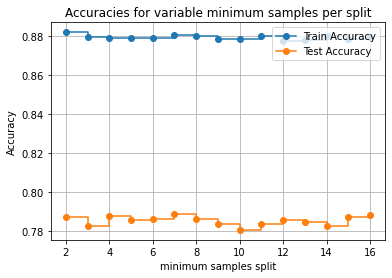

In [72]:
train_acc = []
test_acc = []
min_samp_split = np.arange(15)+2

for i in min_samp_split:
    gbc = GradientBoostingClassifier(min_samples_split = i, learning_rate=0.1, random_state=42)
    gbc.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, gbc.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, gbc.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(min_samp_split, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(min_samp_split, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable minimum samples per split')
plt.xlabel('minimum samples split')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.grid()

In [73]:
print(np.where(test_acc==max(test_acc)))

(array([5], dtype=int64),)


In [77]:
min_samples_split[5]

7

In [78]:
test_acc[5]

0.7888531618435155

Minimum sample per split=7

# minimum samples per leaf

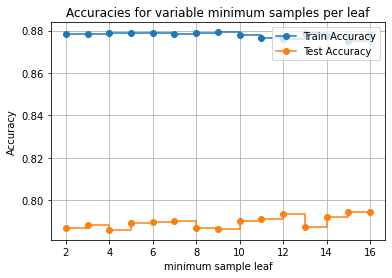

In [83]:
train_acc = []
test_acc = []
min_samples_leaf = np.arange(15)+2

for i in min_samp_split:
    gbc = GradientBoostingClassifier(min_samples_leaf = i, learning_rate=0.1, random_state=42)
    gbc.fit(X_train, Y_train)
    # Training set
    acc_train = accuracy_score(Y_train, gbc.predict(X_train))
    train_acc = np.append(train_acc, acc_train)
    # Test set
    acc_test = accuracy_score(Y_test, gbc.predict(X_test))
    test_acc = np.append(test_acc, acc_test)
    
plt.plot(min_samp_split, train_acc, marker='o', label='Train Accuracy', drawstyle='steps-post')
plt.plot(min_samp_split, test_acc, marker='o', label='Test Accuracy', drawstyle='steps-post')
plt.title('Accuracies for variable minimum samples per leaf')
plt.xlabel('minimum sample leaf')
plt.ylabel('Accuracy')
plt.legend(loc='upper right')
plt.grid()

In [84]:
print(np.where(test_acc==max(test_acc)))

(array([13, 14], dtype=int64),)


In [86]:
min_samples_leaf[13]

15

In [90]:
test_acc[13]

0.7942122186495176

Minimum sample per leaf=15

## Conclusion:

Gradient Boosting Classifier works best in our case with the following properties:

#### n_estimators=100

#### max_depth = 3

#### max_features=3

#### min_samples_split=7

#### min_samples_leaf= 15

## Optimized Gradient Boosting Classifier by individual hyperparameter optimization

In [91]:
gbc_final_ind = GradientBoostingClassifier(
    n_estimators=100,
    max_depth=3, 
    max_features=3,
    learning_rate=0.1,
    subsample=1.0,
    min_samples_leaf=15, 
    min_samples_split=7,
    random_state = 42,
    criterion = 'friedman_mse'
)

gbc_final_ind.fit(X_train, Y_train)

GradientBoostingClassifier(max_features=3, min_samples_leaf=15,
                           min_samples_split=7, random_state=42)

In [92]:
gbc_acc_ind=accuracy_score(Y_test, gbc_final_ind.predict(X_test))
print('Accuracy (test): ',gbc_acc_ind)

Accuracy (test):  0.7931404072883173


# Fine-Tuning model with GridSearch again

In [1]:
#loading libraries and dataset again

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

In [3]:
df = pd.read_csv('group7_15_final_genre_dataset.csv',index_col=0)

In [4]:
Y=df['genre']
X=df.drop('genre',axis=1)

In [5]:
from sklearn.preprocessing import LabelEncoder
Y_encoded = LabelEncoder().fit_transform(Y)

def encoded_genres():
    l = np.array([])
    for a in range(len(pd.Series(Y_encoded).value_counts())):
        for i in range(len(Y)):
            if Y_encoded[i]==a:
                l = np.append(l, Y[i])
                print(a,' means: ',Y[i])
                break
    return l
enc_gen = encoded_genres()
print(enc_gen)

0  means:  afrobeat
1  means:  black-metal
2  means:  bluegrass
3  means:  chicago-house
4  means:  club
5  means:  comedy
6  means:  country
7  means:  forro
8  means:  grindcore
9  means:  happy
10  means:  heavy-metal
11  means:  iranian
12  means:  study
13  means:  turkish
14  means:  world-music
['afrobeat' 'black-metal' 'bluegrass' 'chicago-house' 'club' 'comedy'
 'country' 'forro' 'grindcore' 'happy' 'heavy-metal' 'iranian' 'study'
 'turkish' 'world-music']


In [6]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_encoded, test_size=0.2, random_state=42, stratify=Y_encoded)
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((11192, 14), (2799, 14), (11192,), (2799,))

In [7]:
gb=GradientBoostingClassifier()
gb.fit(X_train, Y_train)

GradientBoostingClassifier()

In [9]:
tuned_parameters = {'n_estimators': [100,500,1000],
          'max_features': [1,2,3,4,5],
          'max_depth': [1,2,3,4,5,6,7,8]}
grid_search = GridSearchCV(gb, tuned_parameters, cv=KFold(3, random_state=42, shuffle=True), n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train,Y_train)

GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8],
                         'max_features': [1, 2, 3, 4, 5],
                         'n_estimators': [500]},
             scoring='accuracy')

In [11]:
import time
start_time = time.time()

print('Best Score: %s' % grid_search.best_score_)
print('Best Hyperparameters: %s' % grid_search.best_params_)

# computation time
comp_time_gs = time.time() - start_time
print("--- Computation time for grid search: %s seconds ---" % comp_time_gs)

Best Score: 0.7894914932710003
Best Hyperparameters: {'max_depth': 8, 'max_features': 2, 'n_estimators': 500}
--- Computation time for grid search: 0.0 seconds ---


## Hyperparameters by GridSearch

Gradient Boosting Classifier works best in our case with the following properties:

#### n_estimators=500

#### max_depth = 8

#### max_features=2

#### min_samples_split=7 (same as before)

#### min_samples_leaf= 15 (same as before)

if we use min_samples_split and min_samples_leaf with some range in grid-search, computation takes much time.
That's why taking these values from previous individual optimization.

# Optimized Gradient Boosting Model with Grid-Search
hyperparameters are selected from individual parameter selection and from gridsearch evaluation

In [29]:
gbc_final_grid = GradientBoostingClassifier(
    n_estimators=500,
    max_depth=8, 
    max_features=2,
    learning_rate=0.1,
    subsample=1.0,
    min_samples_leaf=15, 
    min_samples_split=7,
    random_state = 42,
    criterion = 'friedman_mse'
)

gbc_final_grid.fit(X_train, Y_train)

GradientBoostingClassifier(max_depth=8, max_features=2, min_samples_leaf=15,
                           min_samples_split=7, n_estimators=500,
                           random_state=42)

In [30]:
gbc_acc_grid=accuracy_score(Y_test, gbc_final_grid.predict(X_test))
print('Accuracy (test): ',gbc_acc_grid)

Accuracy (test):  0.8045730618077885


### Individual Hyperparameter Optimization gives accuracy(test): 79.31%
### GridSearch Hyperparameter Optimization gives accuracy(test): 80.46%

### GridSearch Hyperparameter Optimization will be taken as final parameters for retraining model.

# Confusion Matrix for Optimized Gradient Boosting Model

Accuracy (train):  1.0
Accuracy (test):  0.8045730618077885


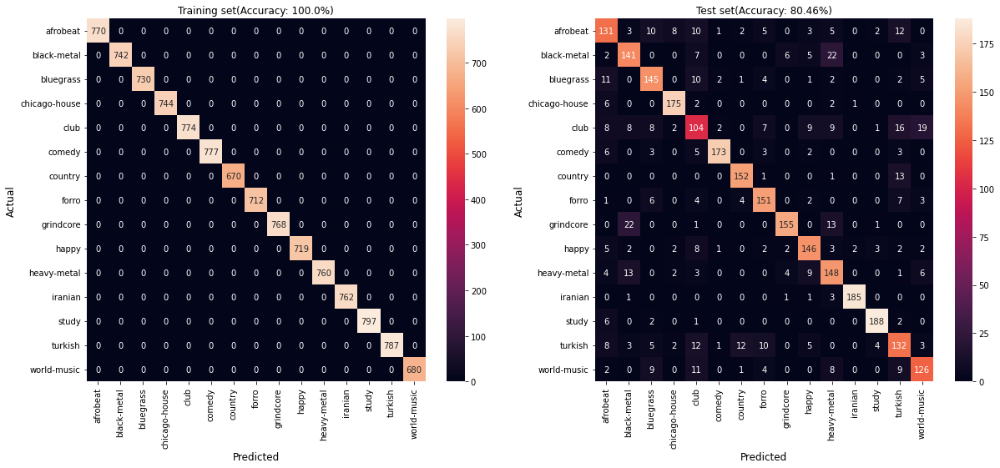

In [31]:
#Confusion matrix for tuned Optimized Gradient Boosting

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,8))

#training set
Y_train_gbc_pred=gbc_final_grid.predict(X_train)
train_accuracy=accuracy_score(Y_train, Y_train_gbc_pred)
print('Accuracy (train): ',train_accuracy)
sns.heatmap(confusion_matrix(Y_train,Y_train_gbc_pred), annot=True,fmt='d', yticklabels=enc_gen,xticklabels=enc_gen,ax=ax1)
ax1.set_title(f'Training set(Accuracy: {round(train_accuracy*100,2)}%)')
ax1.set_xlabel('Predicted',fontsize=12)
ax1.set_ylabel('Actual',fontsize=12);

#test set
Y_test_gbc_pred=gbc_final_grid.predict(X_test)
test_accuracy=accuracy_score(Y_test,Y_test_gbc_pred)
print('Accuracy (test): ',test_accuracy)
sns.heatmap(confusion_matrix(Y_test,Y_test_gbc_pred), annot=True,fmt='d',yticklabels=enc_gen,xticklabels=enc_gen,ax=ax2)
ax2.set_title(f'Test set(Accuracy: {round(test_accuracy*100,2)}%)')
ax2.set_xlabel('Predicted',fontsize=12)
ax2.set_ylabel('Actual',fontsize=12);

plt.savefig('training set_boosting.png', bbox_inches='tight')
plt.savefig('test set_boosting.png', bbox_inches='tight')

## Final Accuracy: 
## For Gradient Boosting Classifier
## Accuracy on training set is 100 % and on test set is 80.46% 

# Classification Report

In [32]:
Y_true, Y_pred = Y_test, gbc_final_grid.predict(X_test)

print('Classification report on final tuned test set:\n %s' %classification_report(Y_true, Y_pred))
print()

Classification report on final tuned test set:
               precision    recall  f1-score   support

           0       0.69      0.68      0.69       192
           1       0.73      0.76      0.74       186
           2       0.77      0.79      0.78       183
           3       0.92      0.94      0.93       186
           4       0.58      0.54      0.56       193
           5       0.96      0.89      0.92       195
           6       0.88      0.91      0.90       167
           7       0.81      0.85      0.83       178
           8       0.92      0.81      0.86       192
           9       0.80      0.81      0.80       180
          10       0.69      0.78      0.73       190
          11       0.98      0.97      0.98       191
          12       0.94      0.94      0.94       199
          13       0.66      0.67      0.67       197
          14       0.75      0.74      0.75       170

    accuracy                           0.80      2799
   macro avg       0.81      0.8

# K-Means Clustering

In [103]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
%matplotlib inline

In [105]:
df = df.drop('time_signature', axis=1)

In [107]:
df['genre'].unique()

array(['country', 'happy', 'club', 'comedy', 'forro', 'chicago-house',
       'world-music', 'bluegrass', 'afrobeat', 'iranian', 'study',
       'heavy-metal', 'turkish', 'black-metal', 'grindcore'], dtype=object)

### Features of interest for clustering

In [108]:
feat_list = ['popularity', 'danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'tempo', 'valence']

In [109]:
X = df[feat_list]

In [111]:
X.head()

,popularity,danceability,energy,speechiness,acousticness,instrumentalness,liveness,tempo,valence
0,64,0.591,0.703,0.0256,0.043500,0.000002,0.1450,95.993,0.402
1,37,0.509,0.927,0.0682,0.000248,0.063900,0.1840,175.032,0.607
2,35,0.790,0.892,0.0462,0.000536,0.672000,0.0455,126.011,0.408
3,63,0.559,0.766,0.0295,0.010700,0.000070,0.1940,145.260,0.723
4,30,0.530,0.721,0.9420,0.859000,0.000000,0.8780,92.675,0.213


### Scaling with the Standard Scaler

In [112]:
scaler = StandardScaler()
df_scaled = scaler.fit(X)
print(df_scaled.mean_)
df_scaled = scaler.transform(X)
print(df_scaled)

[ 34.21327997   0.53291369   0.69906504   0.12586808   0.26987365
   0.27841793   0.2350591  123.9911521    0.42782185]
[[ 1.80917998  0.305062    0.0162595  ... -0.41989015 -0.90324321
  -0.09454515]
 [ 0.16925926 -0.12559167  0.94184142 ... -0.23805715  1.64661937
   0.65604989]
 [ 0.04778365  1.35018492  0.79721924 ... -0.88379744  0.06516194
  -0.07257651]
 ...
 [-0.6203322  -0.01530232  0.81787955 ...  0.26081802  0.09703563
   0.28990597]
 [ 1.14106413 -0.29890352 -0.93411479 ... -0.69590333 -1.54271709
  -0.99892064]
 [ 1.20180193  1.01406499 -0.47132383 ... -0.58307362 -0.96708737
  -0.14946674]]


Text(0.5, 1.0, 'Satandard Scaled dataset')

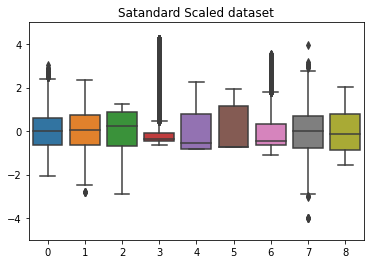

In [113]:
ax = sns.boxplot(data = df_scaled)
plt.ylim(-5, 5)
plt.title('Satandard Scaled dataset')

# Looking at the inertias and sillhouette scores

In [115]:
n_max_clusters = 15

inertias =[]
silhouettes = []
for cluster in range(1, n_max_clusters):
    kmeans_f = KMeans(n_clusters = cluster, init='k-means++', random_state=42)
    labels = kmeans_f.fit_predict(df_scaled)
    inertias.append(kmeans_f.inertia_)
    if cluster > 1:
        silhouettes.append(silhouette_score(df_scaled, labels))

In [104]:
audio_cols = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'tempo', 'valence']

Text(0.5, 1.0, 'inertias')

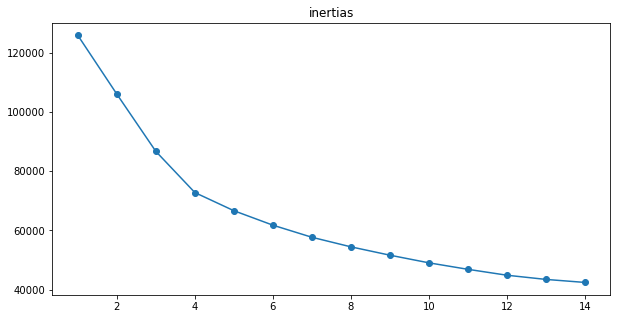

In [116]:
plt.figure(figsize=(10,5))
plt.plot(range(1, n_max_clusters), inertias, linestyle='-', marker='o')
plt.title('inertias')

Text(0.5, 1.0, 'sillhouettes')

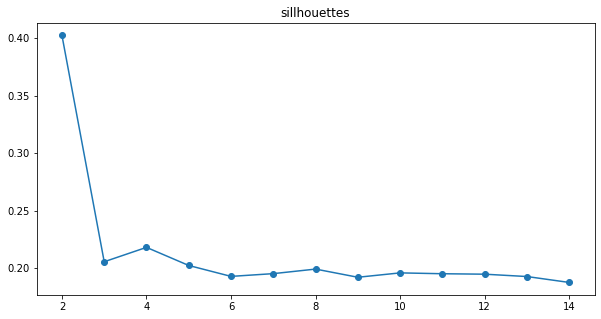

In [117]:
plt.figure(figsize=(10,5))
plt.plot(range(2, n_max_clusters), silhouettes, linestyle='-', marker='o')
plt.title('sillhouettes')

Here we see a local maximum at 4.

So we decide to use 4 Clusters.

# Creating the 4 Clusters

In [118]:
k = 4
kmeans = KMeans(n_clusters = k, init='k-means++', random_state=42)
cluster_labels = kmeans.fit(df_scaled)

# Assigning the clusters to the main dataset

In [119]:
df = df. assign(cluster_labels = kmeans.labels_)

In [120]:
df

,genre,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_s,cluster_labels
0,country,64,0,0.591,0.703,10,1,0.0256,0.043500,0.000002,0.1450,0.4020,95.993,248.0,3
1,happy,37,0,0.509,0.927,11,0,0.0682,0.000248,0.063900,0.1840,0.6070,175.032,236.0,3
2,club,35,0,0.790,0.892,10,0,0.0462,0.000536,0.672000,0.0455,0.4080,126.011,206.0,3
3,country,63,0,0.559,0.766,11,1,0.0295,0.010700,0.000070,0.1940,0.7230,145.260,203.0,3
4,comedy,30,1,0.530,0.721,4,1,0.9420,0.859000,0.000000,0.8780,0.2130,92.675,274.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13986,iranian,0,0,0.461,0.438,5,0,0.6440,0.667000,0.000873,0.1300,0.0659,147.657,257.0,0
13987,country,63,0,0.543,0.837,11,1,0.0608,0.117000,0.000000,0.0872,0.5060,168.056,186.0,3
13988,black-metal,24,0,0.530,0.897,2,1,0.0341,0.000023,0.160000,0.2910,0.5070,126.999,192.0,1
13989,turkish,53,0,0.476,0.473,0,0,0.0397,0.397000,0.000007,0.0858,0.1550,76.171,183.0,0


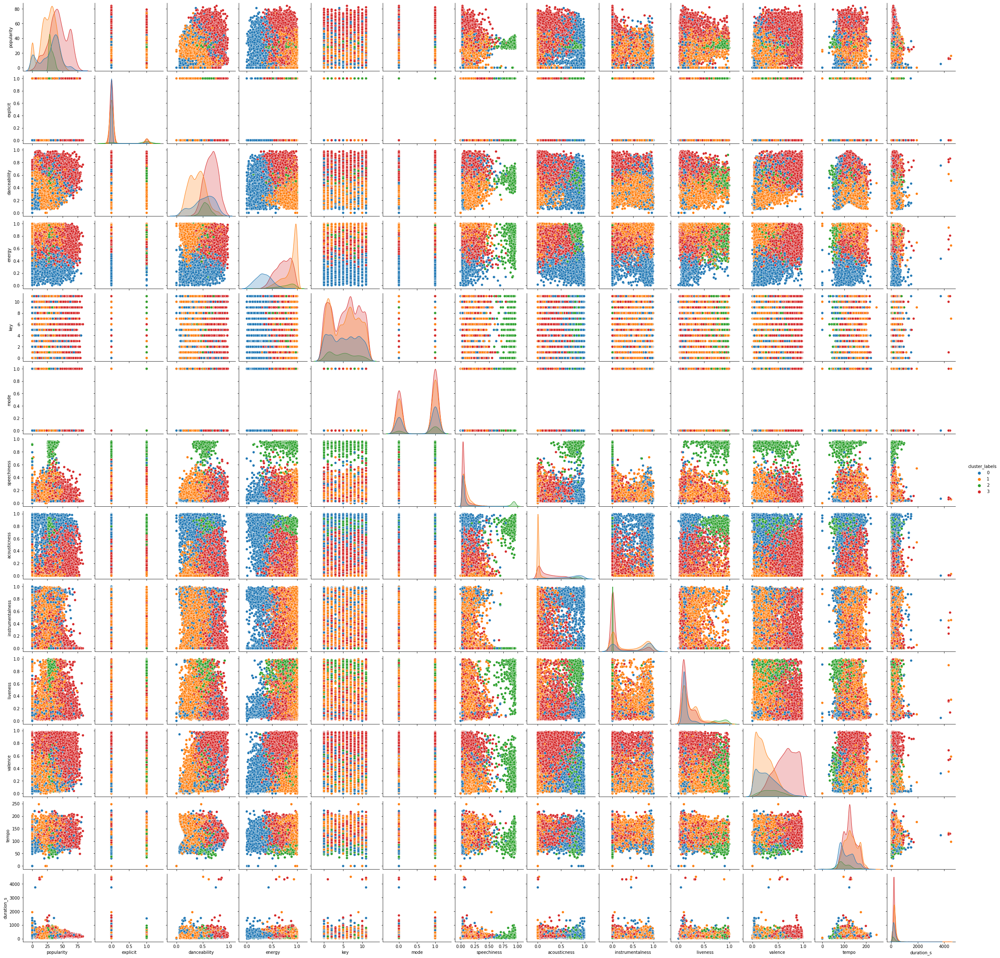

In [122]:
sns.pairplot(df.drop('genre', axis = 1), hue= 'cluster_labels', palette='tab10')

# Creating a table of means for every cluster to every feature

In [123]:
means_data = kmeans.cluster_centers_
means_data = pd.DataFrame(means_data, columns = feat_list)

In [124]:
means_data

,popularity,danceability,energy,speechiness,acousticness,instrumentalness,liveness,tempo,valence
0,-0.211182,-0.108787,-1.509963,-0.297024,1.230796,0.599747,-0.392068,-0.436066,-0.503573
1,-0.454727,-0.728935,0.678622,-0.117798,-0.747942,0.270824,0.070462,0.251506,-0.674276
2,-0.177766,0.103480,0.279408,3.903747,1.670244,-0.743848,2.539042,-0.833652,-0.199979
3,0.506841,0.656234,0.092119,-0.256167,-0.150207,-0.415037,-0.198787,0.095307,0.832211


# Conversion for simpler evaluation of features

In [125]:
mda = np.array(means_data)

#subtraction of the minimum value of given feature-column
for i in range(9):
    minm = np.min(mda[:, i])
    mda[:, i]=mda[:, i]-minm
    
#normalization to 1 by division through the maximum of feature column
for i in range(9):
    maxm = np.max(mda[:, i])
    mda[:, i]=mda[:, i]/maxm
    
mda = pd.DataFrame(mda, columns = feat_list)

Text(0.5, 1.0, 'original heatmap')

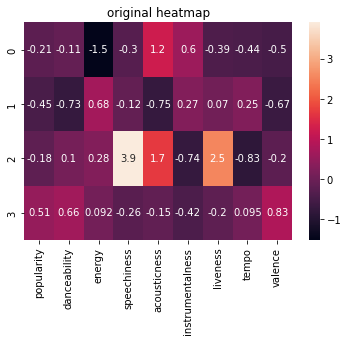

In [126]:
sns.heatmap(data = means_data, annot=True)
plt.title('original heatmap')

Text(0.5, 1.0, 'scaled heatmap')

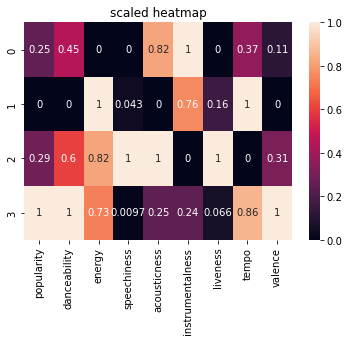

In [127]:
sns.heatmap(data = mda, annot=True)
plt.title('scaled heatmap')

# From heatmap- descriptions of the achieved clusters:

## Descriptions of the achieved clusters:

Cluster 0:

* Max. Instrumentalness
* High Acousticness
* Mid Danceability
* lower tempo
* low popularity
* low valence
* Min. energy
* Min. Speechiness
* Min. Liveness <br>
<br>
Impression: Looks like music for ambience.<br>
Customized Genre Name: Acoustic Instruments

***

Cluster 1:

* Max. Energy
* Max. Tempo
* High Instrumentalness
* low Liveness
* low speechiness
* Min. popularity
* Min. danceability
* Min. acousticness
* Min. valence <br>
<br>
Impression: Fast, high energy instrumentals. <br>
Customized Genre Name: Energetic fast Instrumentals

***

Cluster 2:

* Max. speechiness
* Max. acousticness
* Max. liveness
* high energy
* higher danceability
* lower popularity
* lower valence
* Min. tempo
* Min. instrumentalness <br>
<br>
Impression: Looks like typical guitar songs.<br>
Customized Genre Name: Speechy live acoustic
***

Cluster 3:

* Max. popularity
* Max. danceablity
* Max. valence
* High energy
* High tempo
* low acousticness
* low instrumentalness
* low liveness
* very low speechiness <br>
<br>
Impression: Popular dance-tracks. <br>
Customized Genre Name: Pop-Dance


In [128]:
df

,genre,popularity,explicit,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_s,cluster_labels
0,country,64,0,0.591,0.703,10,1,0.0256,0.043500,0.000002,0.1450,0.4020,95.993,248.0,3
1,happy,37,0,0.509,0.927,11,0,0.0682,0.000248,0.063900,0.1840,0.6070,175.032,236.0,3
2,club,35,0,0.790,0.892,10,0,0.0462,0.000536,0.672000,0.0455,0.4080,126.011,206.0,3
3,country,63,0,0.559,0.766,11,1,0.0295,0.010700,0.000070,0.1940,0.7230,145.260,203.0,3
4,comedy,30,1,0.530,0.721,4,1,0.9420,0.859000,0.000000,0.8780,0.2130,92.675,274.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13986,iranian,0,0,0.461,0.438,5,0,0.6440,0.667000,0.000873,0.1300,0.0659,147.657,257.0,0
13987,country,63,0,0.543,0.837,11,1,0.0608,0.117000,0.000000,0.0872,0.5060,168.056,186.0,3
13988,black-metal,24,0,0.530,0.897,2,1,0.0341,0.000023,0.160000,0.2910,0.5070,126.999,192.0,1
13989,turkish,53,0,0.476,0.473,0,0,0.0397,0.397000,0.000007,0.0858,0.1550,76.171,183.0,0


# Short encoding of genres just for algorithm purpose

In [130]:
from sklearn.preprocessing import LabelEncoder

Y=df['genre']
Y_encoded = LabelEncoder().fit_transform(Y)

def encoded_genres():
    l = np.array([])
    for a in range(len(pd.Series(Y_encoded).value_counts())):
        for i in range(len(Y)):
            if Y_encoded[i]==a:
                l = np.append(l, Y[i])
#                 print(a,' means: ',Y[i])
                break
    return l

enc_gen = encoded_genres()

[0.13097713 0.04741379 0.47754655 0.03763441 0.12512927 0.03395062
 0.08960573 0.00561798 0.00416667 0.00444939 0.02631579 0.52885624
 0.83433735 0.16056911 0.31529412]


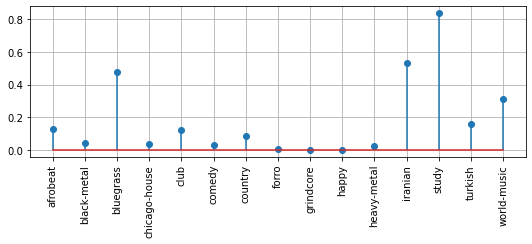

[0.07796258 0.94181034 0.01971522 0.23548387 0.39193382 0.01440329
 0.00716846 0.01235955 0.99479167 0.76529477 0.76736842 0.46589717
 0.03514056 0.08231707 0.39764706]


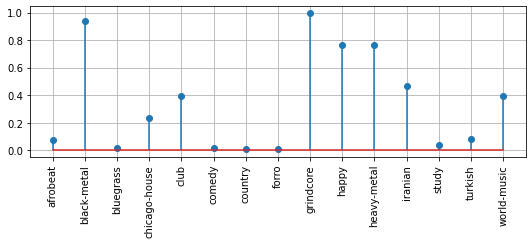

[0.         0.         0.         0.         0.00206825 0.73868313
 0.         0.         0.         0.00222469 0.         0.00419727
 0.         0.         0.        ]


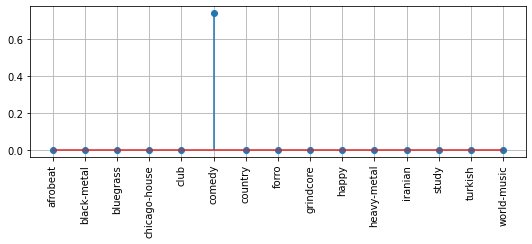

[0.79106029 0.01077586 0.50273823 0.72688172 0.48086867 0.21296296
 0.90322581 0.98202247 0.00104167 0.22803115 0.20631579 0.00104932
 0.13052209 0.75711382 0.28705882]


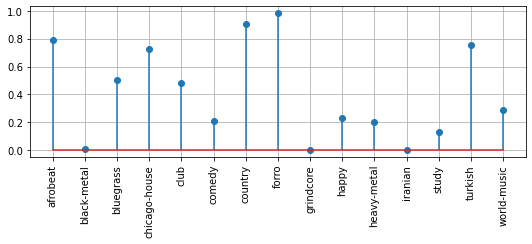

In [131]:
plt.rcParams["figure.figsize"] = [7.50, 3.50]
plt.rcParams["figure.autolayout"] = True

cluster_genre_list = []

for i in range(4):
    re =[]
    for j in enc_gen:
        re = np.append(re, len(df[(df['genre']==j) & (df['cluster_labels']==i)])/len(df[(df['genre']==j)]))

    plt.stem(enc_gen, re)
    print(re)
    plt.grid()
    plt.xticks(rotation=90)
    plt.show()

In the Cell above you see the ratio of amount of elements contained in the cluster and in the genre divided by the overall amount of elements in the genre. 100% would mean, that all songs of this genre belongs to this cluster.

# Clusters and Customized Labels


Cluster 0(Acoustic Instruments):

* bluegrass (half)
* iranian (half)
* study
* world-music (third)

Cluster 1(energetic fast Instrumentals):

* black_metal
* club (half)
* grindcore
* happy
* heavy-metal
* iranian (half)
* world-music (third)

Cluster 2(speech live acoustic):

* comedy

Cluster 3(Pop- Dance):

* afrobeat
* bluegrass (half)
* chicago-house
* club (half)
* country
* forro
* turkish
* world-music (third)

# Summary

The given attempt of clustering is not perfect, but nethertheless the resulting clusters show some structure for possible oredering or grouping of given genres.